# Parallel Simulations of Traffic Flow in Smart Cities

## Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for seaborn
sns.set(style="whitegrid")

import warnings
def warns(*args,**kwargs): pass
warnings.warn=warns

## Load Dataset

In [2]:
data = pd.read_csv('traffic.csv')
display(data)

,DateTime,Junction,Vehicles,ID
0,2015-11-01 00:00:00,1,15,20151101001
1,2015-11-01 01:00:00,1,13,20151101011
2,2015-11-01 02:00:00,1,10,20151101021
3,2015-11-01 03:00:00,1,7,20151101031
4,2015-11-01 04:00:00,1,9,20151101041
...,...,...,...,...
48115,2017-06-30 19:00:00,4,11,20170630194
48116,2017-06-30 20:00:00,4,30,20170630204
48117,2017-06-30 21:00:00,4,16,20170630214
48118,2017-06-30 22:00:00,4,22,20170630224


In [3]:
display(data.head(10))

,DateTime,Junction,Vehicles,ID
0,2015-11-01 00:00:00,1,15,20151101001
1,2015-11-01 01:00:00,1,13,20151101011
2,2015-11-01 02:00:00,1,10,20151101021
3,2015-11-01 03:00:00,1,7,20151101031
4,2015-11-01 04:00:00,1,9,20151101041
5,2015-11-01 05:00:00,1,6,20151101051
6,2015-11-01 06:00:00,1,9,20151101061
7,2015-11-01 07:00:00,1,8,20151101071
8,2015-11-01 08:00:00,1,11,20151101081
9,2015-11-01 09:00:00,1,12,20151101091


## Exploratory Data Analysis

### Check Missing Values

In [4]:
print("Missing Values:")
print(data.isnull().sum())

Missing Values:
DateTime    0
Junction    0
Vehicles    0
ID          0
dtype: int64


### Check Duplicate Values

In [5]:
data.duplicated().sum()

0

### Display Basic Information about Dataset

In [6]:
print("Dataset Info:")
display(data.info())

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48120 entries, 0 to 48119
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   DateTime  48120 non-null  object
 1   Junction  48120 non-null  int64 
 2   Vehicles  48120 non-null  int64 
 3   ID        48120 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB


None

### Extract additional time-related features

In [7]:
# Convert DateTime to datetime object
data['DateTime'] = pd.to_datetime(data['DateTime'])

data['Year'] = data['DateTime'].dt.year
data['Month'] = data['DateTime'].dt.month
data['Day'] = data['DateTime'].dt.day
data['Hour'] = data['DateTime'].dt.hour
data['Weekday'] = data['DateTime'].dt.day_name()

print("\nExtracted DateTime Features:")
display(data)



Extracted DateTime Features:


,DateTime,Junction,Vehicles,ID,Year,Month,Day,Hour,Weekday
0,2015-11-01 00:00:00,1,15,20151101001,2015,11,1,0,Sunday
1,2015-11-01 01:00:00,1,13,20151101011,2015,11,1,1,Sunday
2,2015-11-01 02:00:00,1,10,20151101021,2015,11,1,2,Sunday
3,2015-11-01 03:00:00,1,7,20151101031,2015,11,1,3,Sunday
4,2015-11-01 04:00:00,1,9,20151101041,2015,11,1,4,Sunday
...,...,...,...,...,...,...,...,...,...
48115,2017-06-30 19:00:00,4,11,20170630194,2017,6,30,19,Friday
48116,2017-06-30 20:00:00,4,30,20170630204,2017,6,30,20,Friday
48117,2017-06-30 21:00:00,4,16,20170630214,2017,6,30,21,Friday
48118,2017-06-30 22:00:00,4,22,20170630224,2017,6,30,22,Friday


In [8]:
data.sample(10)

,DateTime,Junction,Vehicles,ID,Year,Month,Day,Hour,Weekday
42474,2017-05-07 18:00:00,3,13,20170507183,2017,5,7,18,Sunday
12496,2017-04-04 16:00:00,1,89,20170404161,2017,4,4,16,Tuesday
27219,2017-04-10 03:00:00,2,14,20170410032,2017,4,10,3,Monday
32917,2016-04-04 13:00:00,3,13,20160404133,2016,4,4,13,Monday
4813,2016-05-19 13:00:00,1,48,20160519131,2016,5,19,13,Thursday
40226,2017-02-03 02:00:00,3,11,20170203023,2017,2,3,2,Friday
5759,2016-06-27 23:00:00,1,45,20160627231,2016,6,27,23,Monday
39704,2017-01-12 08:00:00,3,14,20170112083,2017,1,12,8,Thursday
26832,2017-03-25 00:00:00,2,24,20170325002,2017,3,25,0,Saturday
20424,2016-07-01 00:00:00,2,15,20160701002,2016,7,1,0,Friday


### Descriptive Statistics

In [9]:
# Descriptive statistics for numerical columns
print("Descriptive Statistics:")
display(data.describe())

Descriptive Statistics:


,DateTime,Junction,Vehicles,ID,Year,Month,Day,Hour
count,48120,48120.000000,48120.000000,4.812000e+04,48120.000000,48120.000000,48120.000000,48120.000000
mean,2016-09-19 06:03:56.109725696,2.180549,22.791334,2.016330e+10,2016.269825,5.884289,15.700748,11.500000
min,2015-11-01 00:00:00,1.000000,1.000000,2.015110e+10,2015.000000,1.000000,1.000000,0.000000
25%,2016-04-16 01:45:00,1.000000,9.000000,2.016042e+10,2016.000000,3.000000,8.000000,5.750000
50%,2016-09-30 03:30:00,2.000000,15.000000,2.016093e+10,2016.000000,5.000000,16.000000,11.500000
75%,2017-02-25 16:00:00,3.000000,29.000000,2.017023e+10,2017.000000,9.000000,23.000000,17.250000
max,2017-06-30 23:00:00,4.000000,180.000000,2.017063e+10,2017.000000,12.000000,31.000000,23.000000
std,NaN,0.966955,20.750063,5.944854e+06,0.616093,3.569872,8.784073,6.922258


### Vehicles Per Junction


In [10]:
display(data.groupby('Junction')['Vehicles'].sum())

Junction
1    657412
2    207983
3    199823
4     31501
Name: Vehicles, dtype: int64

### Correlation Heat Map

In [11]:
# Select numeric columns
numeric_columns = data.select_dtypes(include=[np.number]).drop(columns=['ID'])

# Calculate Spearman's correlation
corr_spearman = numeric_columns.corr(method='spearman')

# Calculate Pearson correlation
corr_pearson = numeric_columns.corr(method='pearson')

<Axes: title={'center': 'Features Correlation using Pearson Correlation Matrix'}>

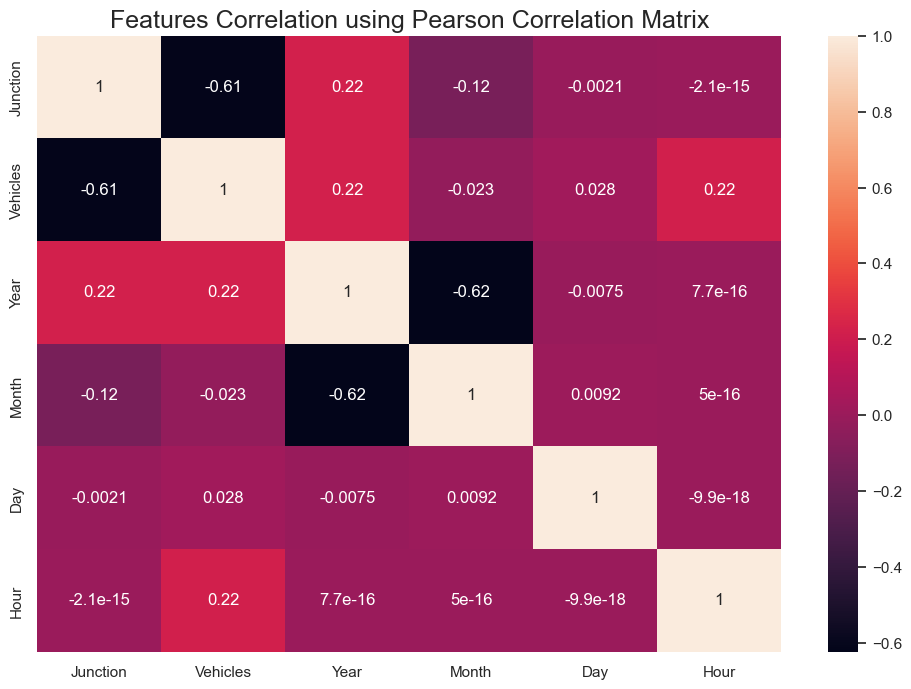

In [12]:
plt.figure(figsize=(12,8))
plt.title("Features Correlation using Pearson Correlation Matrix", fontsize=18)
sns.heatmap(corr_pearson, annot=True)

<Axes: title={'center': "Features Correlation using Spearman's Rank Correlation Matrix"}>

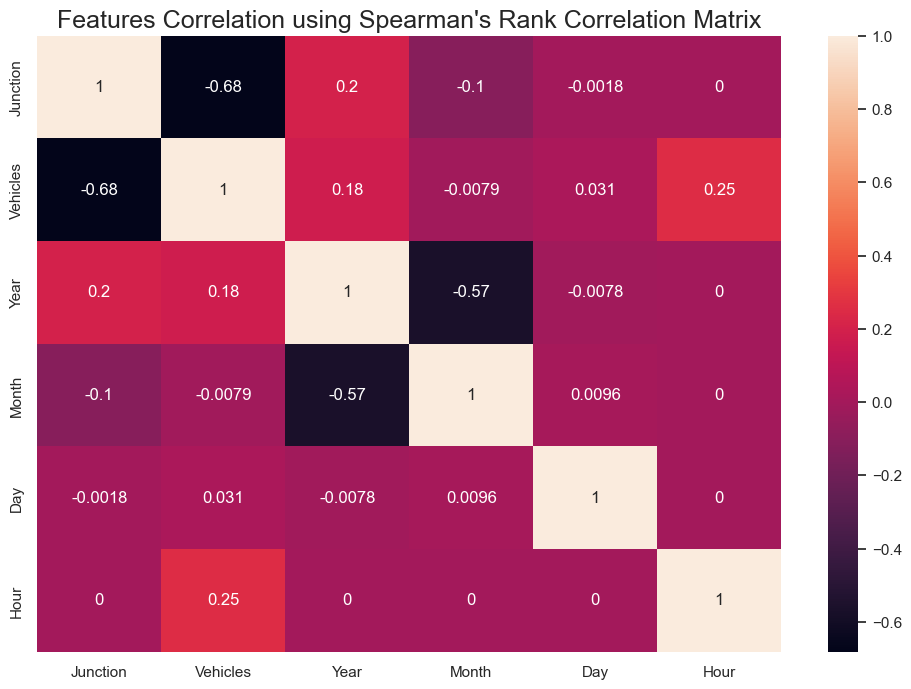

In [13]:
plt.figure(figsize=(12,8))
plt.title("Features Correlation using Spearman's Rank Correlation Matrix", fontsize=18)
sns.heatmap(corr_spearman, annot=True)

### Distribution of Traffic

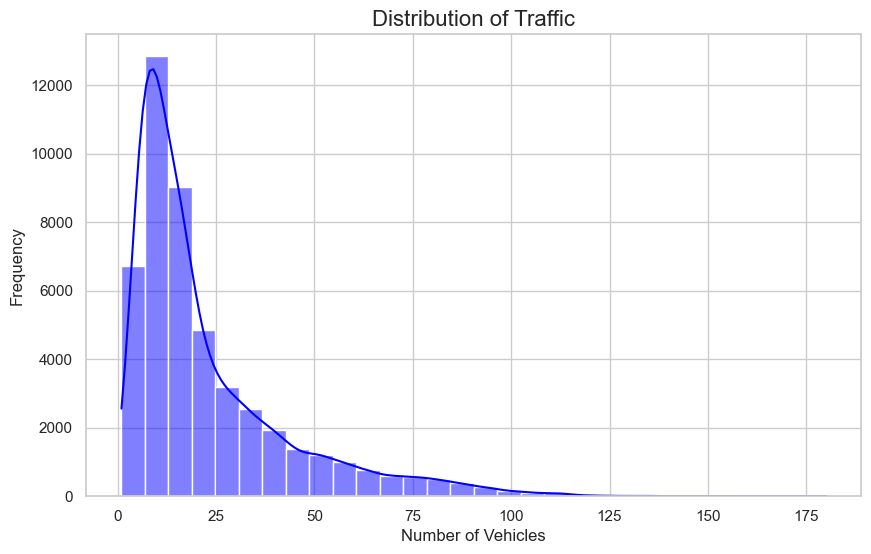

In [14]:
# Histogram of Vehicles
plt.figure(figsize=(10, 6))
sns.histplot(data['Vehicles'], bins=30, kde=True, color='blue')
plt.title("Distribution of Traffic", fontsize=16)
plt.xlabel("Number of Vehicles", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.show()


### Total Traffic per Junction

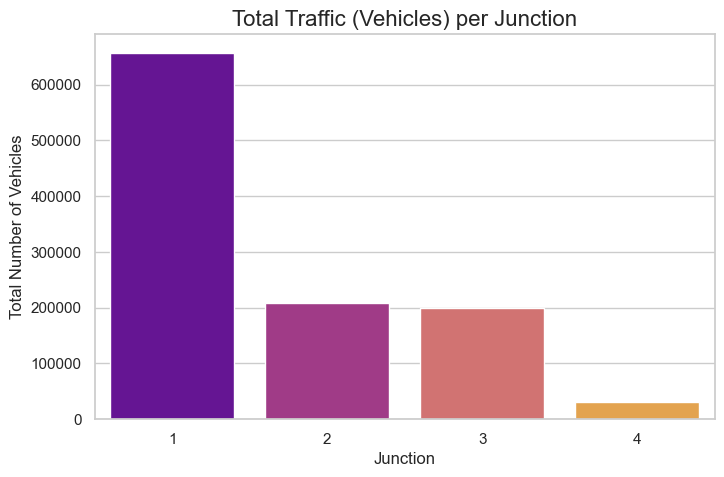

In [15]:
# Bar plot for total Vehicles per Junction
plt.figure(figsize=(8, 5))
junction_vehicles = data.groupby('Junction')['Vehicles'].sum().reset_index()
sns.barplot(x='Junction', y='Vehicles', data=junction_vehicles, palette='plasma')
plt.title("Total Traffic (Vehicles) per Junction", fontsize=16)
plt.xlabel("Junction", fontsize=12)
plt.ylabel("Total Number of Vehicles", fontsize=12)
plt.show()


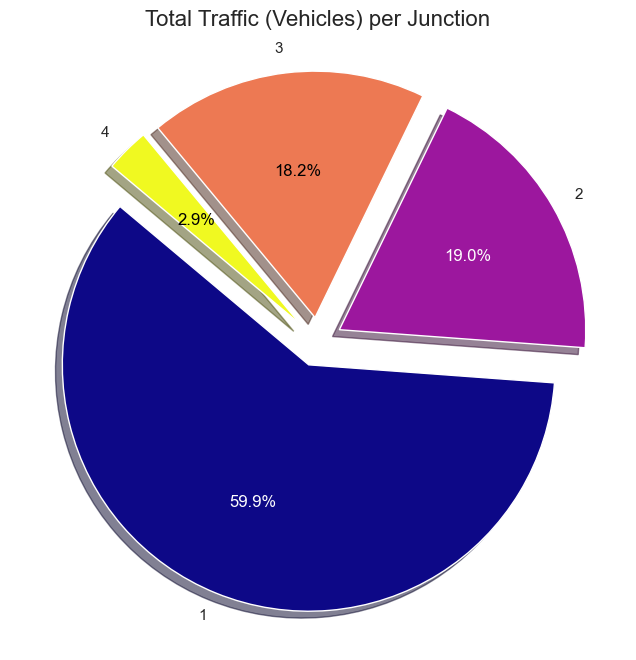

In [16]:
import matplotlib.pyplot as plt
import numpy as np

# Data preparation
junction_vehicles = data.groupby('Junction')['Vehicles'].sum().reset_index()

# Pie chart parameters
labels = junction_vehicles['Junction']
sizes = junction_vehicles['Vehicles']
explode = [0.1] * len(labels)  # To slightly pull out each slice for emphasis
colors = plt.cm.plasma(np.linspace(0, 1, len(labels)))

# Function to calculate luminance of a color
def calculate_luminance(color):
    r, g, b = color[:3]  # Extract RGB values
    return 0.2989 * r + 0.587 * g + 0.114 * b  # Standard luminance formula

# Create a 2D pie chart with a 3D look
fig, ax = plt.subplots(figsize=(8, 8))
wedges, texts, autotexts = ax.pie(
    sizes,
    explode=explode,
    labels=labels,
    autopct='%1.1f%%',
    startangle=140,
    colors=colors,
    shadow=True,  # Add shadow for a 3D effect
)

# Adjust annotation colors based on luminance
for i, autotext in enumerate(autotexts):
    luminance = calculate_luminance(colors[i])
    if luminance < 0.5:  # Dark color
        autotext.set_color('white')
    else:  # Light color
        autotext.set_color('black')
    autotext.set_fontsize(12)

# Set title
ax.set_title("Total Traffic (Vehicles) per Junction", fontsize=16)

# Show the plot
plt.show()


### Average Traffic per Junction per Hour

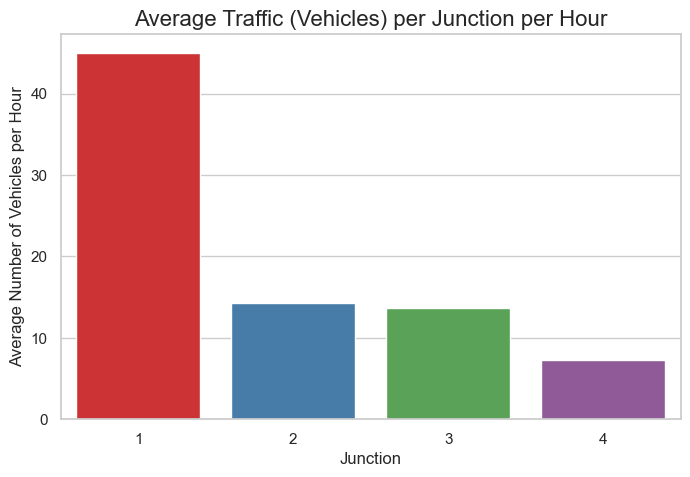

In [17]:
# Bar plot for average Vehicles per Junction
plt.figure(figsize=(8, 5))

# Group by 'Junction' and calculate the average number of vehicles per junction
junction_vehicles_avg = data.groupby('Junction')['Vehicles'].mean().reset_index()

# Create the bar plot
sns.barplot(x='Junction', y='Vehicles', data=junction_vehicles_avg, palette='Set1')

# Customize the plot
plt.title("Average Traffic (Vehicles) per Junction per Hour", fontsize=16)
plt.xlabel("Junction", fontsize=12)
plt.ylabel("Average Number of Vehicles per Hour", fontsize=12)

# Show the plot
plt.show()


In [18]:
# Get unique junctions
junctions = data['Junction'].unique()


### Hourly Traffic Trend

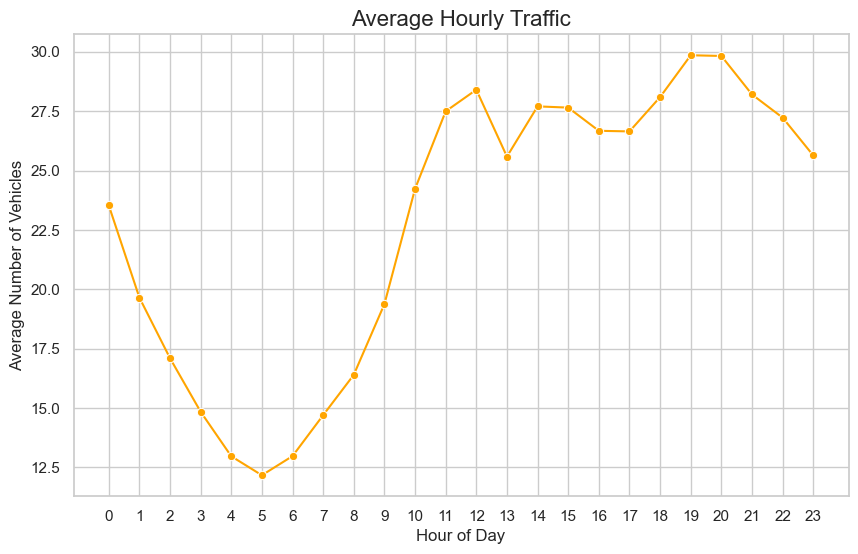

In [19]:
# Average vehicles per hour
hourly_traffic = data.groupby('Hour')['Vehicles'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.lineplot(x='Hour', y='Vehicles', data=hourly_traffic, marker='o', color='orange')
plt.title("Average Hourly Traffic", fontsize=16)
plt.xlabel("Hour of Day", fontsize=12)
plt.ylabel("Average Number of Vehicles", fontsize=12)
plt.xticks(range(0, 24))
plt.grid(True)
plt.show()


### Hourly Traffic Trend Per Junction

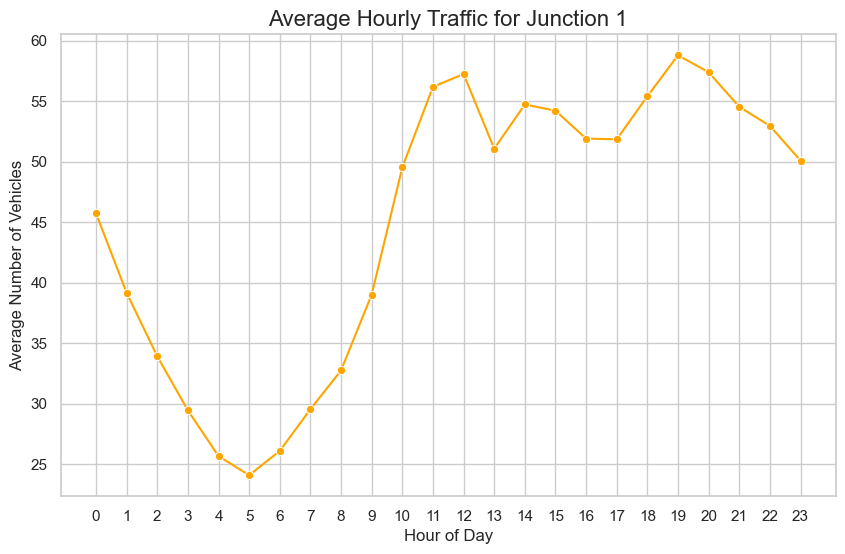

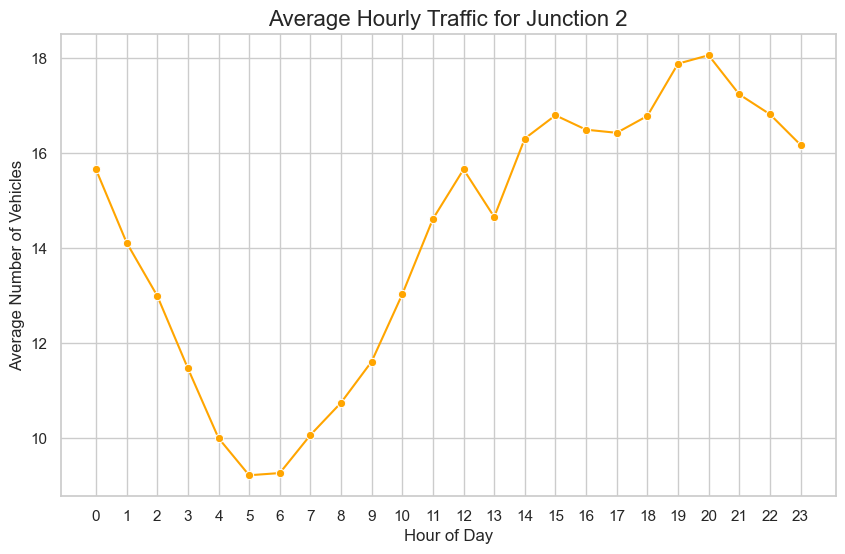

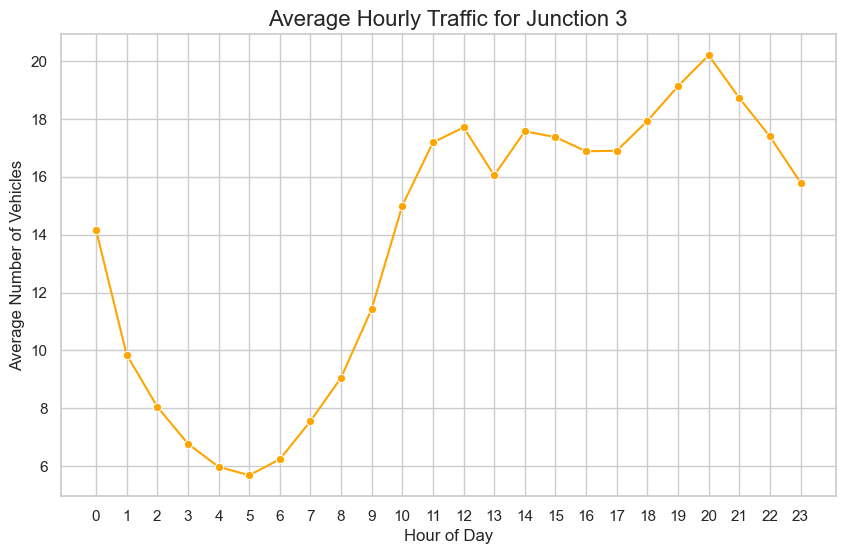

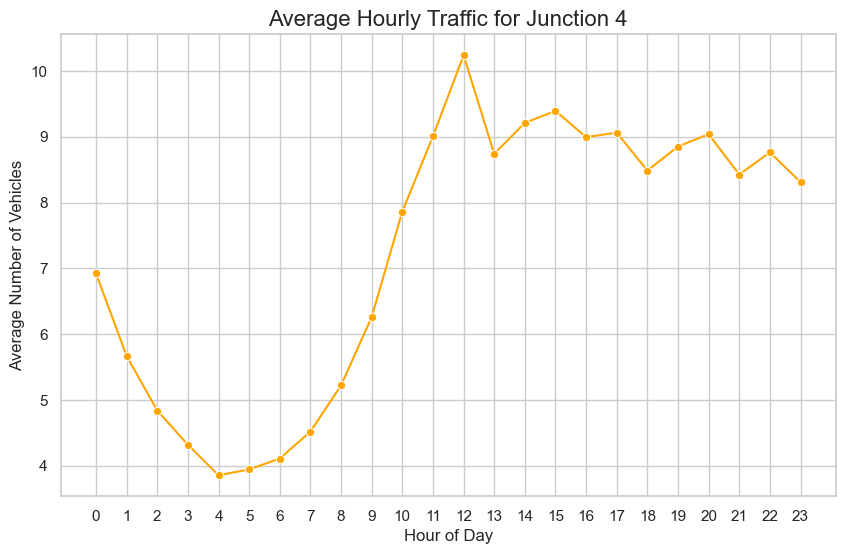

In [20]:
# Loop over each junction to plot the average hourly traffic trend
for junction in junctions:
    # Filter data for the current junction
    junction_data = data[data['Junction'] == junction]
    
    # Calculate the average number of vehicles per hour for the current junction
    hourly_traffic = junction_data.groupby('Hour')['Vehicles'].mean().reset_index()

    # Plot the average hourly traffic trend for the current junction
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='Hour', y='Vehicles', data=hourly_traffic, marker='o', color='orange')
    plt.title(f"Average Hourly Traffic for Junction {junction}", fontsize=16)
    plt.xlabel("Hour of Day", fontsize=12)
    plt.ylabel("Average Number of Vehicles", fontsize=12)
    plt.xticks(range(0, 24))  # Display hours 0 to 23
    plt.grid(True)
    plt.show()

### Average Traffic per Weekday

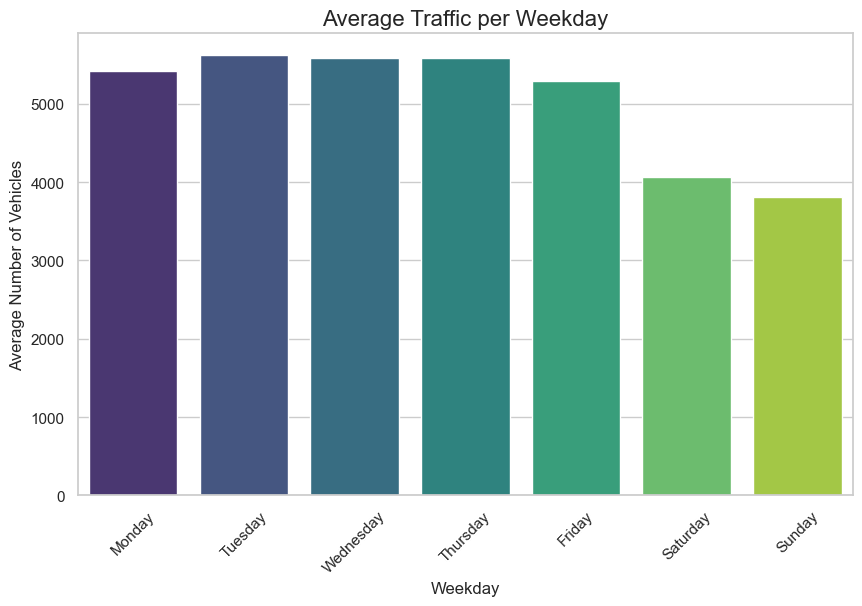

In [21]:
# Group by Weekday and Hour, sum the vehicles for each group
hourly_traffic = data.groupby(['Weekday', 'Day'])['Vehicles'].sum().reset_index()

# Calculate the average of vehicles per weekday
weekday_traffic = hourly_traffic.groupby('Weekday')['Vehicles'].mean().reset_index()

# Order days of the week
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_traffic['Weekday'] = pd.Categorical(weekday_traffic['Weekday'], categories=weekday_order, ordered=True)

plt.figure(figsize=(10, 6))
sns.barplot(x='Weekday', y='Vehicles', data=weekday_traffic, palette='viridis')
plt.title("Average Traffic per Weekday", fontsize=16)
plt.xlabel("Weekday", fontsize=12)
plt.ylabel("Average Number of Vehicles", fontsize=12)
plt.xticks(rotation=45)
plt.show()


### Average Traffic per Weekday per Junction

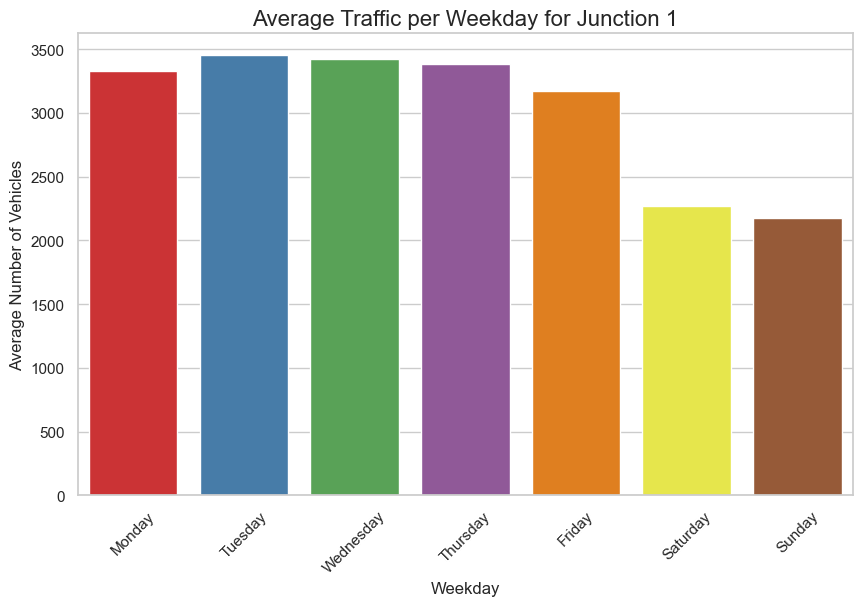

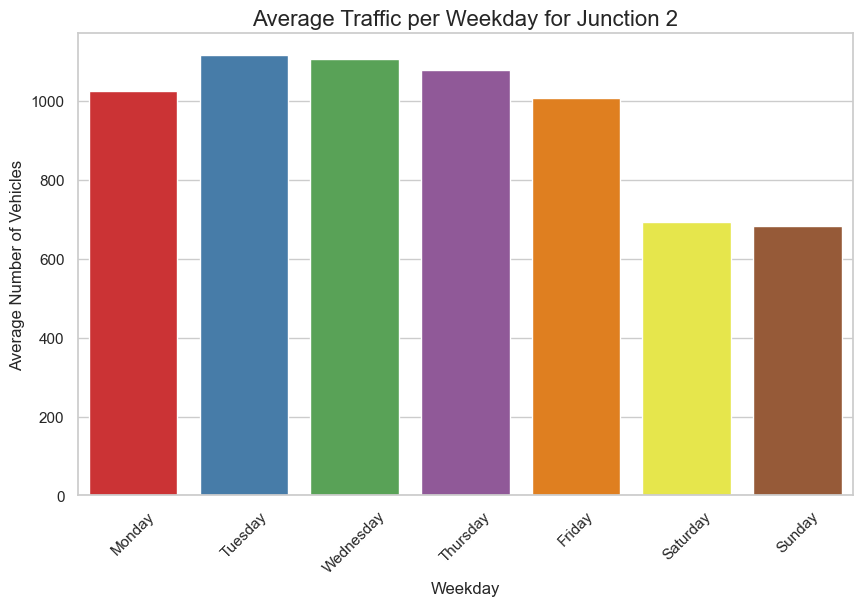

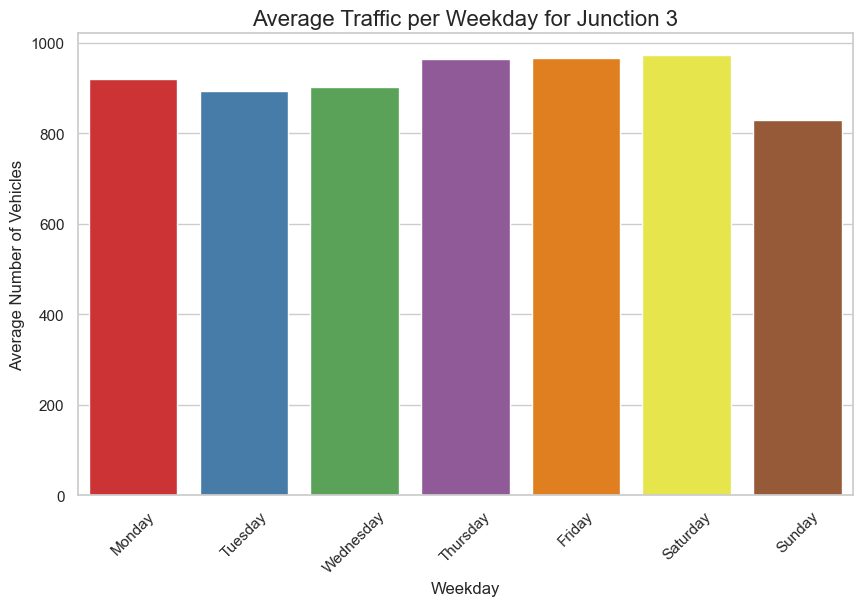

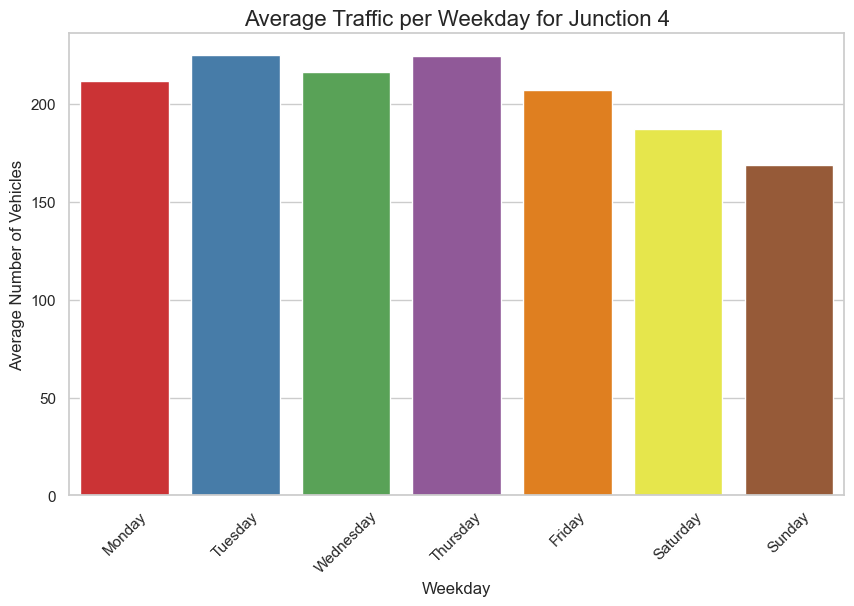

In [22]:
# Loop over each junction to plot the average weekday traffic trend
for junction in junctions:
    # Filter data for the current junction
    junction_data = data[data['Junction'] == junction]

    # Group by Weekday and Hour, sum the vehicles for each group
    hourly_traffic = junction_data.groupby(['Weekday', 'Day'])['Vehicles'].sum().reset_index()

    # Calculate the average of vehicles per weekday
    weekday_traffic = hourly_traffic.groupby('Weekday')['Vehicles'].mean().reset_index()
    
    # Order days of the week
    weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    weekday_traffic['Weekday'] = pd.Categorical(weekday_traffic['Weekday'], categories=weekday_order, ordered=True)
    
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Weekday', y='Vehicles', data=weekday_traffic, palette='Set1')
    plt.title(f"Average Traffic per Weekday for Junction {junction}", fontsize=16)
    plt.xlabel("Weekday", fontsize=12)
    plt.ylabel("Average Number of Vehicles", fontsize=12)
    plt.xticks(rotation=45)
    plt.show()

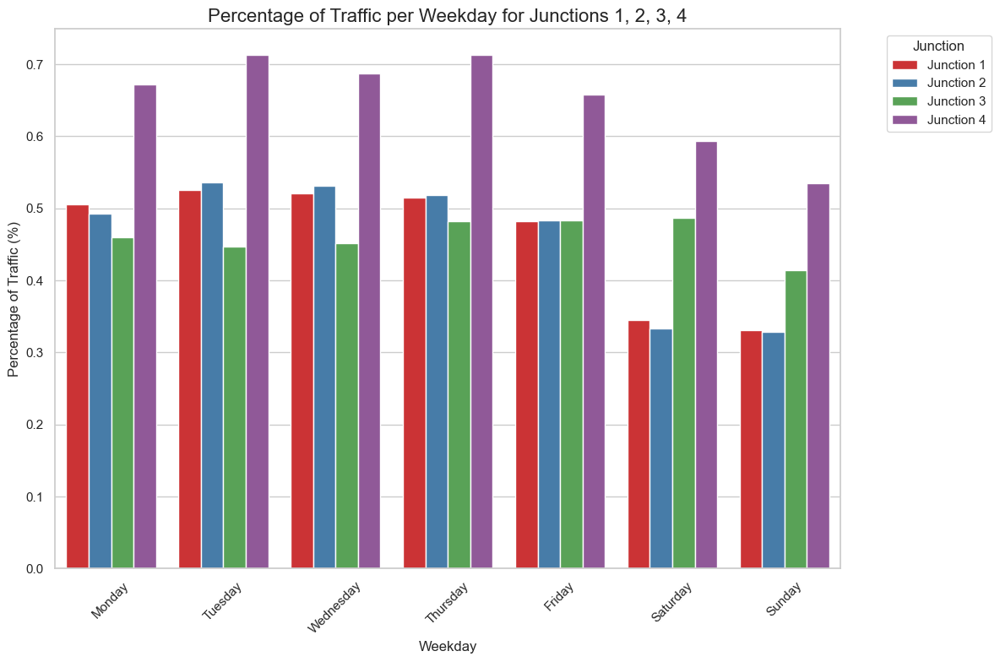

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Order days of the week
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Prepare a DataFrame to store traffic for all junctions
all_junctions_traffic = []

# Loop over each junction to calculate the average weekday traffic and convert to percentage
for junction in junctions:
    # Filter data for the current junction
    junction_data = data[data['Junction'] == junction]

    # Group by Weekday and Hour, sum the vehicles for each group
    hourly_traffic = junction_data.groupby(['Weekday', 'Day'])['Vehicles'].sum().reset_index()

    # Calculate the total traffic for the junction
    total_traffic = hourly_traffic['Vehicles'].sum()

    # Calculate the percentage of vehicles per weekday
    hourly_traffic['Percentage'] = (hourly_traffic['Vehicles'] / total_traffic) * 100

    # Group by Weekday and calculate the average percentage
    weekday_traffic = hourly_traffic.groupby('Weekday')['Percentage'].mean().reset_index()

    # Add a column for Junction to distinguish the data
    weekday_traffic['Junction'] = f'Junction {junction}'

    # Append to the list of all junction traffic data
    all_junctions_traffic.append(weekday_traffic)

# Concatenate all junctions' traffic data into a single DataFrame
all_junctions_traffic_df = pd.concat(all_junctions_traffic, ignore_index=True)

# Order the 'Weekday' column properly
all_junctions_traffic_df['Weekday'] = pd.Categorical(all_junctions_traffic_df['Weekday'], categories=weekday_order, ordered=True)

# Plotting the data
plt.figure(figsize=(12, 8))

sns.barplot(x='Weekday', y='Percentage', hue='Junction', data=all_junctions_traffic_df, palette='Set1')

# Adding title and labels
plt.title("Percentage of Traffic per Weekday for Junctions 1, 2, 3, 4", fontsize=16)
plt.xlabel("Weekday", fontsize=12)
plt.ylabel("Percentage of Traffic (%)", fontsize=12)
plt.xticks(rotation=45)

# Display the legend and plot
plt.legend(title='Junction', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### Monthly Traffic Trend

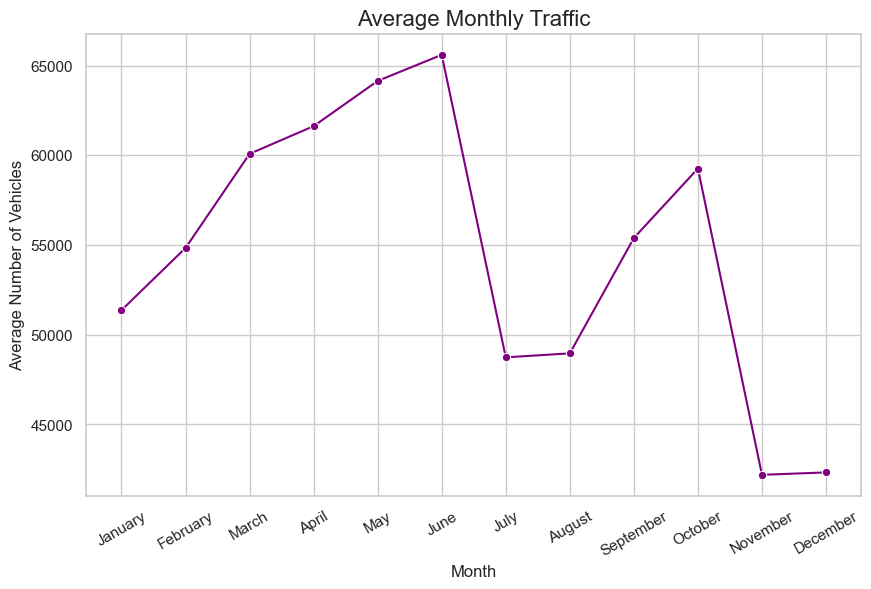

In [24]:
# Sum vehicles per hour for each Month
daily_traffic = data.groupby(['Year', 'Month'])['Vehicles'].sum().reset_index()

# Calculate the average of vehicles per month
monthly_traffic = daily_traffic.groupby('Month')['Vehicles'].mean().reset_index()

# Ensure that the 'Month' column is treated as a categorical variable for proper ordering
monthly_traffic['Month'] = pd.Categorical(monthly_traffic['Month'], categories=range(1, 13), ordered=True)

# Map numeric months to month names
month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April', 
    5: 'May', 6: 'June', 7: 'July', 8: 'August', 
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}
monthly_traffic['Month_Name'] = monthly_traffic['Month'].map(month_names)

# Plotting the data
plt.figure(figsize=(10, 6))
sns.lineplot(x='Month_Name', y='Vehicles', data=monthly_traffic, marker='o', color='purple')
plt.title("Average Monthly Traffic", fontsize=16)
plt.xlabel("Month", fontsize=12)
plt.ylabel("Average Number of Vehicles", fontsize=12)
plt.xticks(rotation=30)   
plt.grid(True)
plt.show()


### Monthly Traffic Trend per Junction

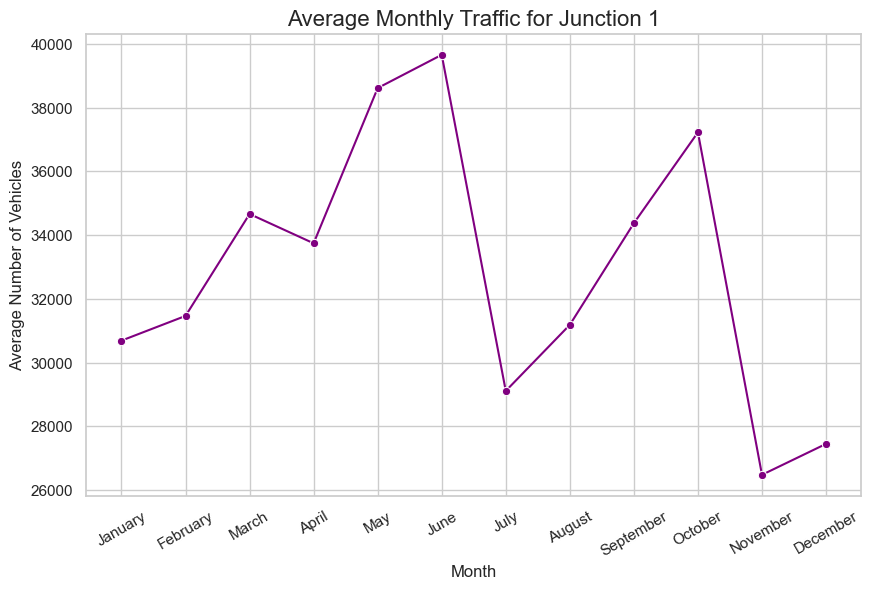

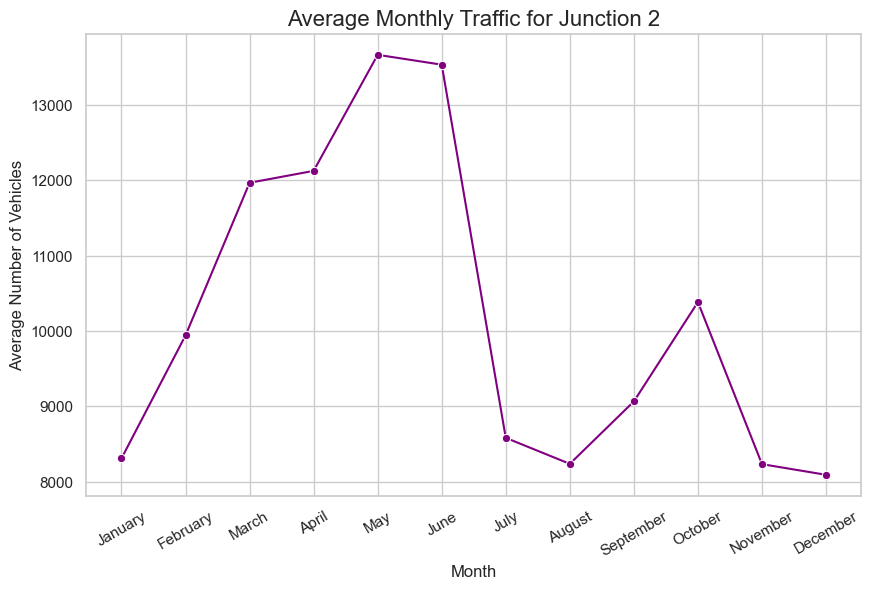

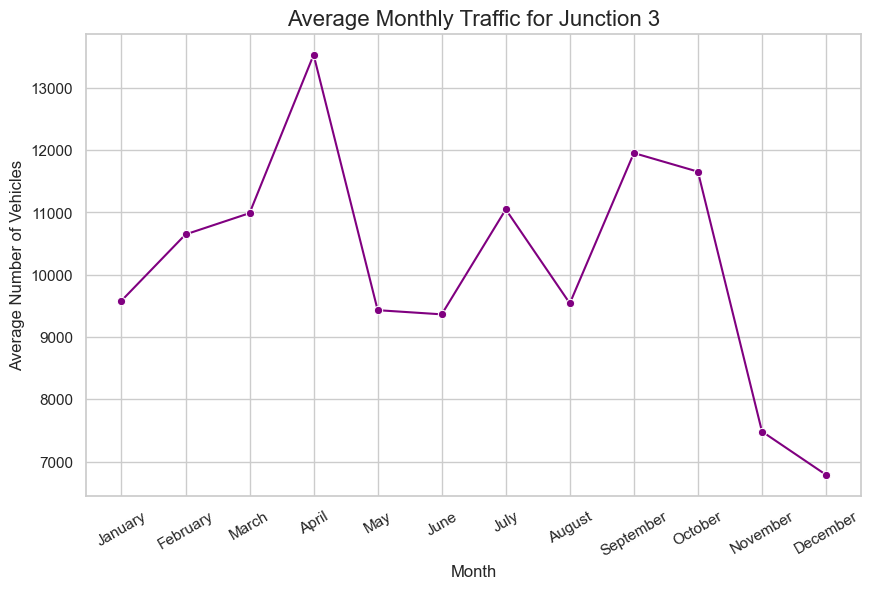

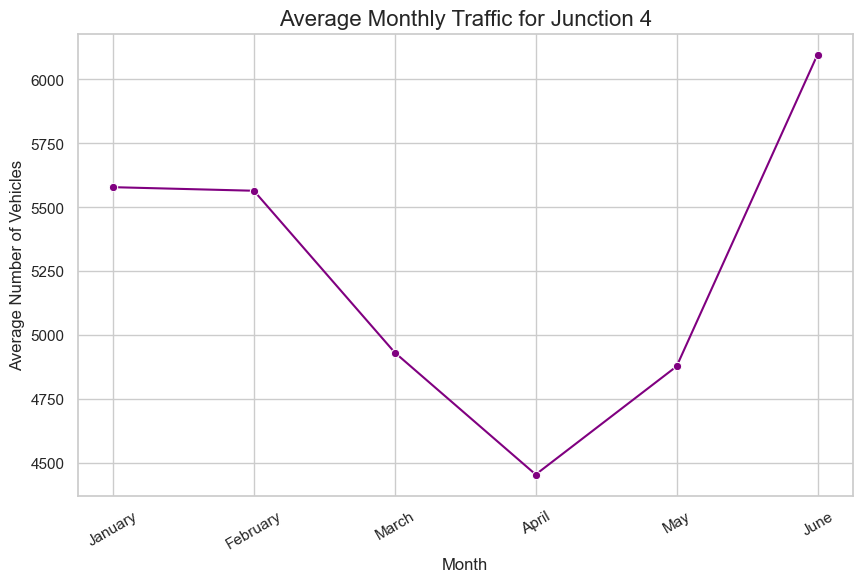

In [25]:
# Loop over each junction to plot the average monthly traffic trend
for junction in junctions:
    # Filter data for the current junction
    junction_data = data[data['Junction'] == junction]
    
    # Sum vehicles per hour for each Month
    daily_traffic = junction_data.groupby(['Year', 'Month'])['Vehicles'].sum().reset_index()

    # Calculate the average of vehicles per month
    monthly_traffic = daily_traffic.groupby('Month')['Vehicles'].mean().reset_index()

    # Map numeric months to month names
    month_names = {
        1: 'January', 2: 'February', 3: 'March', 4: 'April', 
        5: 'May', 6: 'June', 7: 'July', 8: 'August', 
        9: 'September', 10: 'October', 11: 'November', 12: 'December'
    }
    monthly_traffic['Month_Name'] = monthly_traffic['Month'].map(month_names)

    # Plot the average monthly traffic trend for the current junction
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='Month_Name', y='Vehicles', data=monthly_traffic, marker='o', color='purple')
    plt.title(f"Average Monthly Traffic for Junction {junction}", fontsize=16)
    plt.xlabel("Month", fontsize=12)
    plt.ylabel("Average Number of Vehicles", fontsize=12)
    plt.xticks(rotation=30)
    plt.grid(True)
    plt.show()

### Average Traffic Pattern Over time for a Month

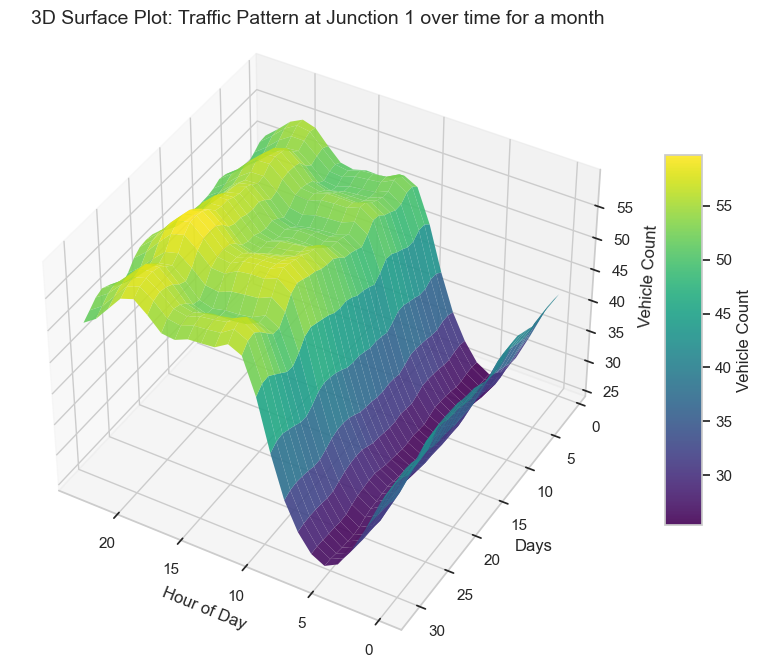

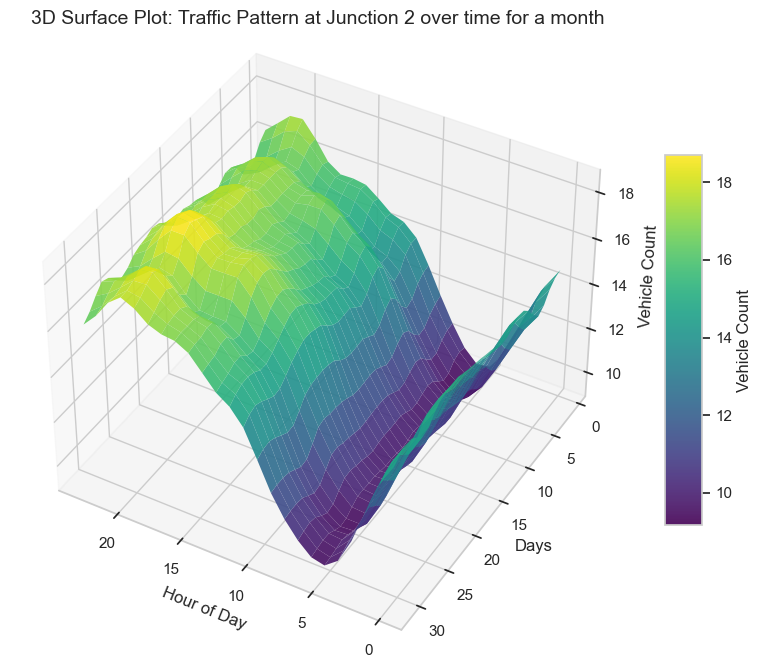

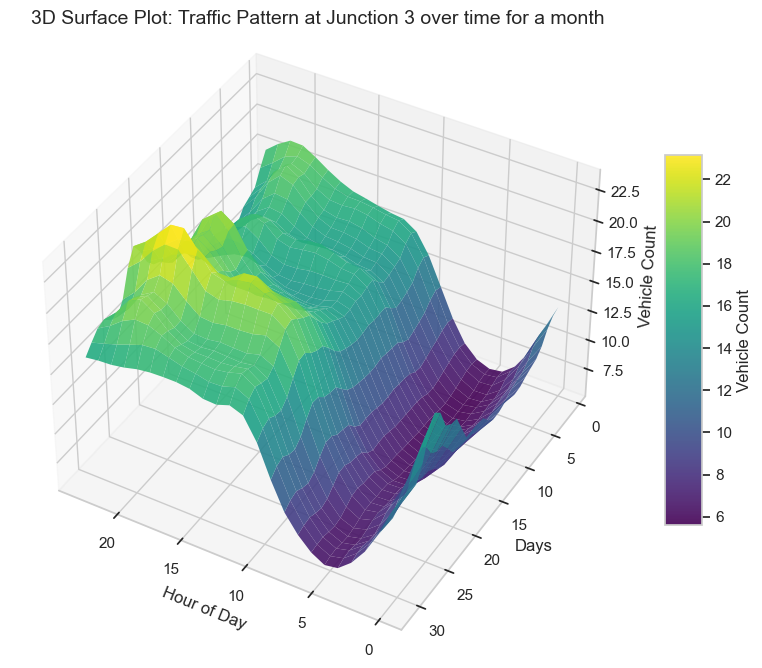

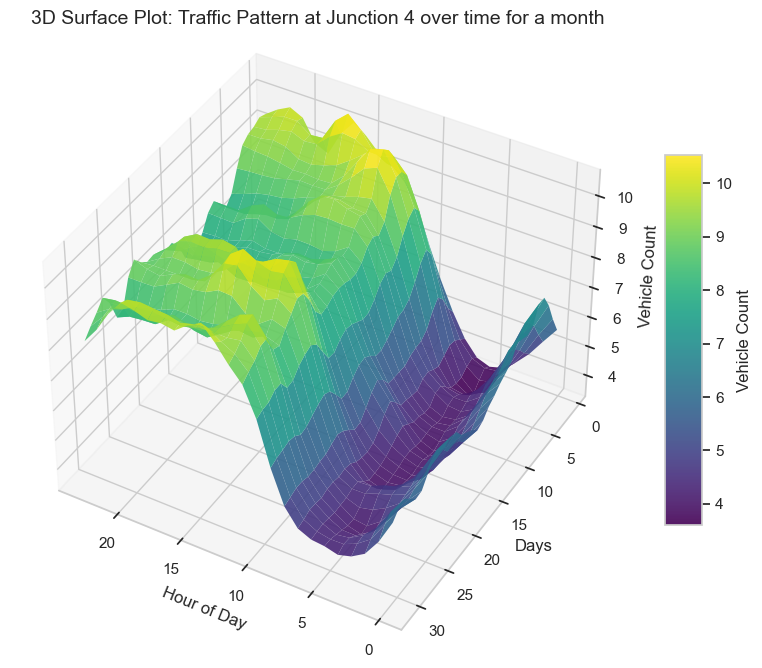

In [26]:
from scipy.ndimage import gaussian_filter
from mpl_toolkits.mplot3d import Axes3D

for junction in junctions:
    # Filter data for the current junction
    junction_data = data[data['Junction'] == junction]
    
    # Create a pivot table for 'Day' x 'Hour' with average 'Vehicles'
    pivot = junction_data.pivot_table(index='Day', columns='Hour', values='Vehicles', aggfunc='mean')
    
    # Fill in missing values (if any)
    pivot = pivot.fillna(method='ffill', axis=1).fillna(0)
    
    # Smooth the data to reduce noise
    Z = gaussian_filter(pivot.values, sigma=1)
    
    # Prepare meshgrid for the 3D plot
    X, Y = np.meshgrid(pivot.columns, pivot.index)
    
    # Plot 3D surface
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    surface = ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='none', alpha=0.9)
    ax.set_title(f"3D Surface Plot: Traffic Pattern at Junction {junction} over time for a month", fontsize=14)
    ax.set_xlabel("Hour of Day", fontsize=12)
    ax.set_ylabel("Days", fontsize=12)
    ax.set_zlabel("Vehicle Count", fontsize=12)
    fig.colorbar(surface, ax=ax, shrink=0.6, aspect=10, label='Vehicle Count')
    ax.view_init(elev=40, azim=120)  # Adjust viewing angle if needed
    
    # Show the plot
    plt.show()

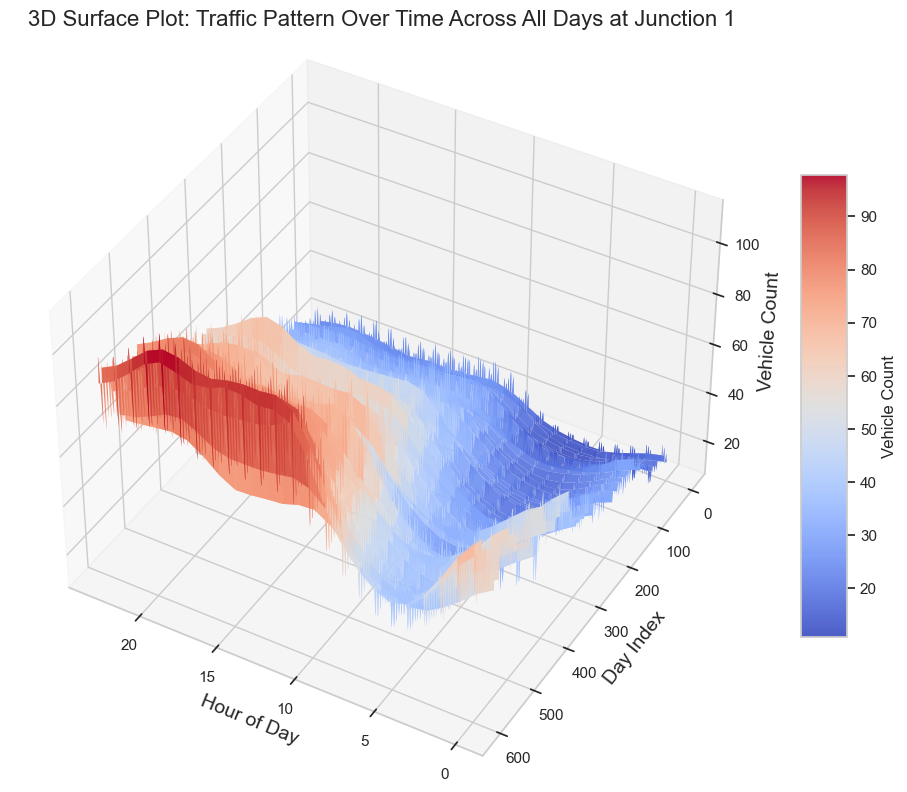

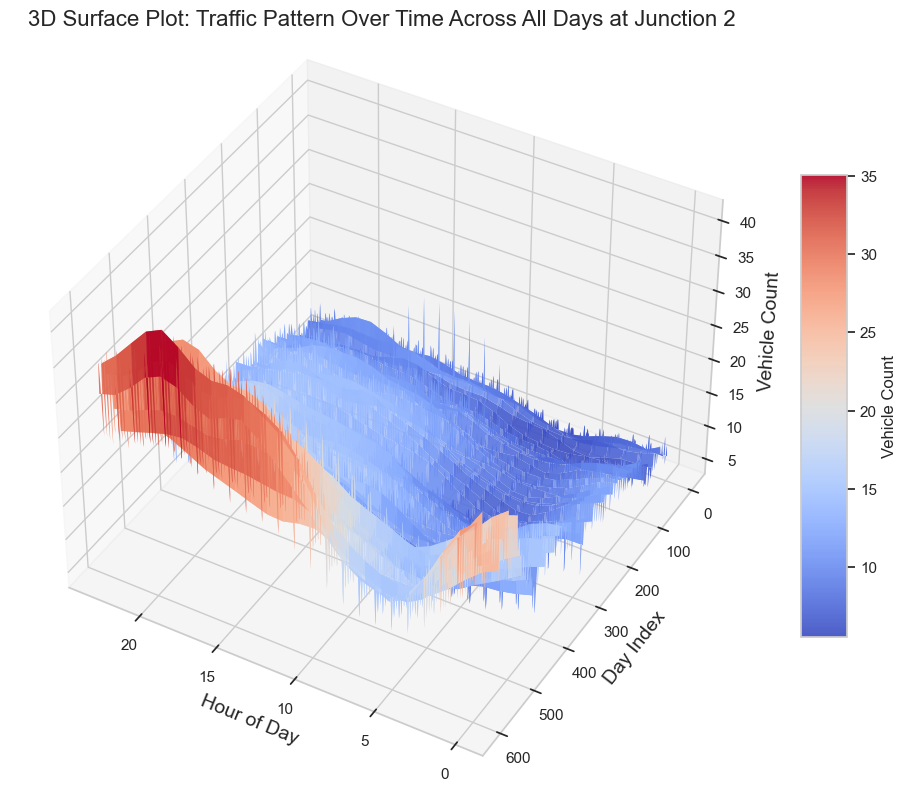

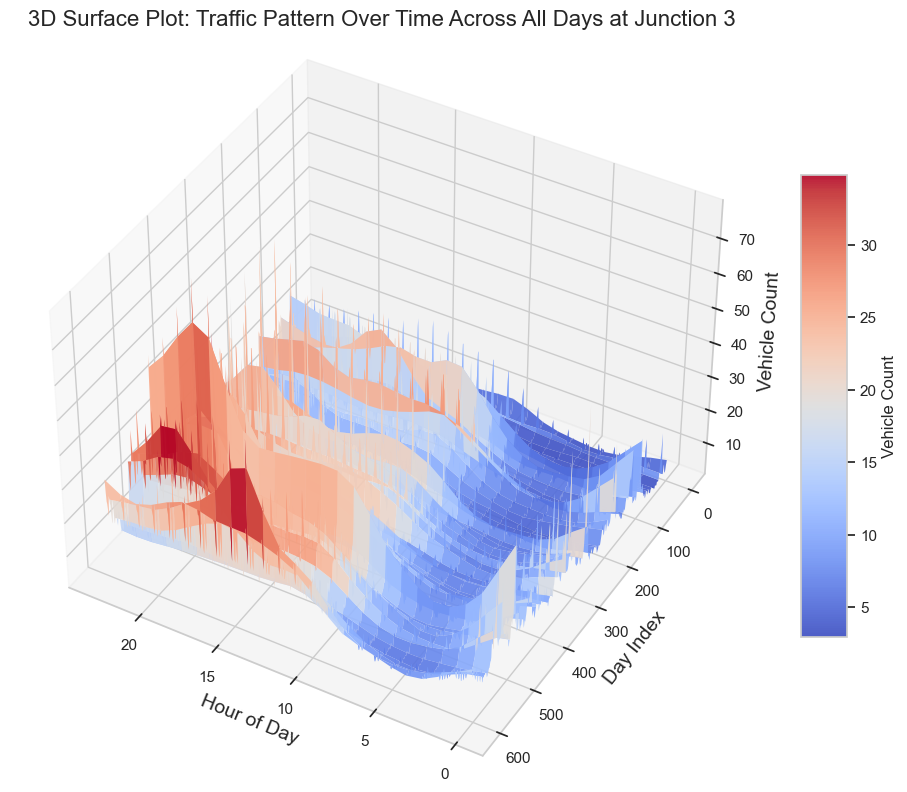

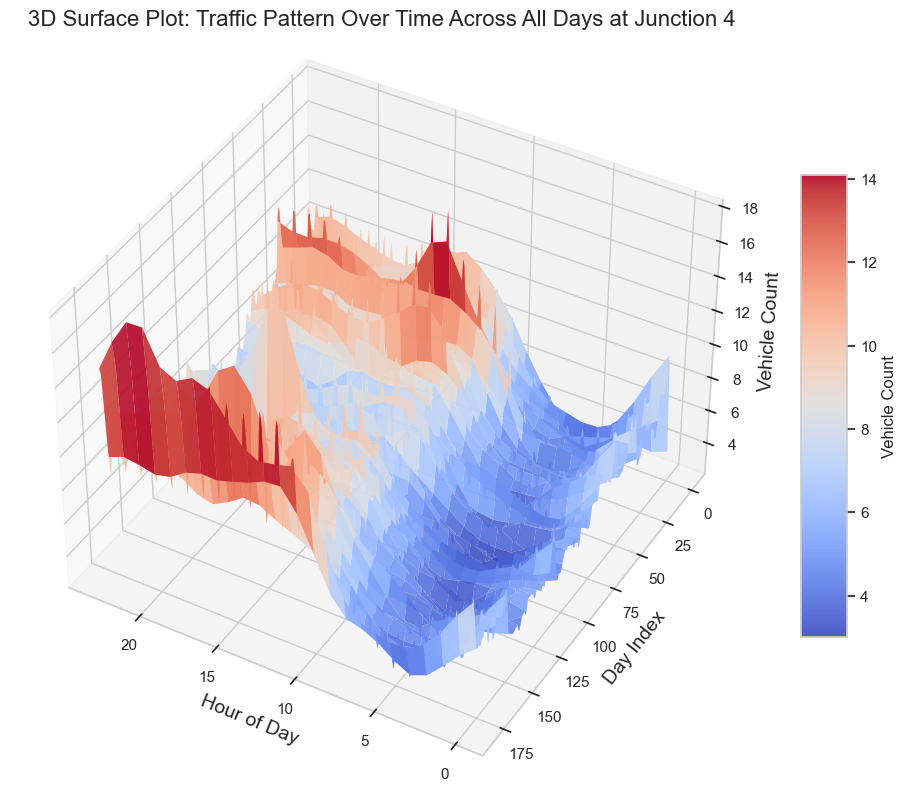

In [27]:
from scipy.ndimage import gaussian_filter
from mpl_toolkits.mplot3d import Axes3D

for junction in junctions:
    # Filter data for the current junction
    junction_data = data[data['Junction'] == junction]
    
    
    # Extract 'Day' and 'Hour' from 'Datetime'
    junction_data['Day'] = junction_data['DateTime'].dt.date
    junction_data['Hour'] = junction_data['DateTime'].dt.hour
    
    # Create a pivot table for 'Day' x 'Hour' with average 'Vehicles'
    pivot = junction_data.pivot_table(index='Day', columns='Hour', values='Vehicles', aggfunc='mean')
    
    # Fill in missing values (if any)
    pivot = pivot.fillna(method='ffill', axis=1).fillna(0)
    
    # Smooth the data to reduce noise
    Z = gaussian_filter(pivot.values, sigma=1)
    
    # Prepare meshgrid for the 3D plot
    X, Y = np.meshgrid(pivot.columns, np.arange(len(pivot.index)))
    
    # Plot 3D surface
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    surface = ax.plot_surface(X, Y, Z, cmap='coolwarm', edgecolor='none', alpha=0.9)
    ax.set_title(f"3D Surface Plot: Traffic Pattern Over Time Across All Days at Junction {junction}", fontsize=16)
    ax.set_xlabel("Hour of Day", fontsize=14)
    ax.set_ylabel("Day Index", fontsize=14)
    ax.set_zlabel("Vehicle Count", fontsize=14)
    fig.colorbar(surface, ax=ax, shrink=0.6, aspect=10, label='Vehicle Count')
    ax.view_init(elev=40, azim=120)  # Adjust viewing angle if needed
    
    # Show the plot
    plt.show()

### Outlier Detection

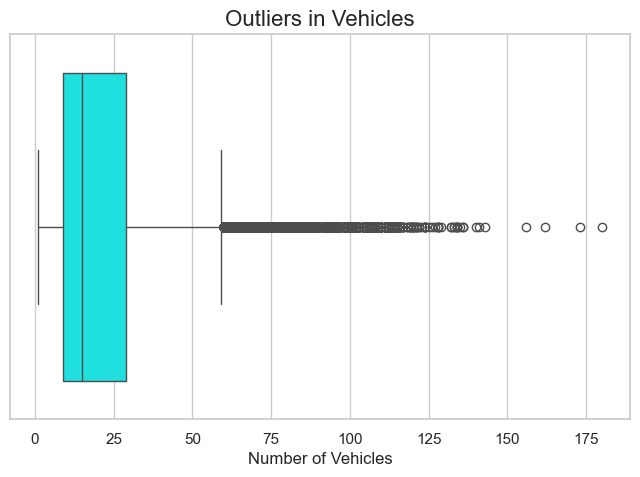

In [28]:
# Boxplot for outliers in Vehicles
plt.figure(figsize=(8, 5))
sns.boxplot(x=data['Vehicles'], color='cyan')
plt.title("Outliers in Vehicles", fontsize=16)
plt.xlabel("Number of Vehicles", fontsize=12)
plt.show()


## Data Preprocessing

### Outlier Removal

In [29]:
# Finding the IQR for the 'Vehicles' column
percentile25 = data['Vehicles'].quantile(0.25)
percentile75 = data['Vehicles'].quantile(0.75)
iqr = percentile75 - percentile25

# Calculate the upper and lower limits for outliers
upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr

# Capping the outliers in the 'Vehicles' column
data['Vehicles'] = np.where(
    data['Vehicles'] > upper_limit,
    upper_limit,
    np.where(
        data['Vehicles'] < lower_limit,
        lower_limit,
        data['Vehicles']
    )
)


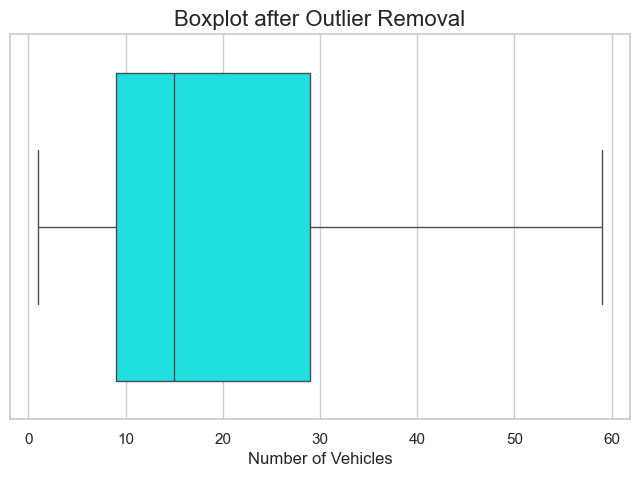

In [30]:
# Boxplot after Outlier Removal
plt.figure(figsize=(8, 5))
sns.boxplot(x=data['Vehicles'], color='cyan')
plt.title("Boxplot after Outlier Removal", fontsize=16)
plt.xlabel("Number of Vehicles", fontsize=12)
plt.show()


## Resampling - Downsampling

In [31]:
# Set DateTime as the index
data.set_index('DateTime', inplace=True)

# Group by 'Junction' and resample daily, summing the 'Vehicles' column
daily_traffic = data.groupby('Junction').resample('D')['Vehicles'].sum()

# Convert to DataFrame and rename index to 'Date'
daily_traffic = daily_traffic.reset_index(level=0)
daily_traffic.index.name = 'Date'  # Rename index

# Display the DataFrame
daily_traffic

,Junction,Vehicles
Date,,
2015-11-01,1,327.0
2015-11-02,1,546.0
2015-11-03,1,544.0
2015-11-04,1,498.0
2015-11-05,1,464.0
...,...,...
2017-06-26,4,181.0
2017-06-27,4,225.0
2017-06-28,4,276.0


In [32]:
daily_traffic.head(610)

,Junction,Vehicles
Date,,
2015-11-01,1,327.0
2015-11-02,1,546.0
2015-11-03,1,544.0
2015-11-04,1,498.0
2015-11-05,1,464.0
...,...,...
2017-06-28,1,1359.0
2017-06-29,1,1349.0
2017-06-30,1,1349.0


## Creating more junctions to show parallelism

In [33]:
# Create a copy of the existing data
new_data = daily_traffic.copy()

# Define the existing and new junction mappings
existing_junctions = [1, 2, 3]  # Available junctions
new_junctions = list(range(5, 15))  # New junctions to be created (5 to 14)

# Replicate data for new junctions
replicated_data = pd.DataFrame()

for i, new_junction in enumerate(new_junctions):
    temp = new_data[new_data['Junction'] == existing_junctions[i % len(existing_junctions)]].copy()
    temp['Junction'] = new_junction  # Assign new junction number
    replicated_data = pd.concat([replicated_data, temp])  # Append data

# Combine original data with replicated data
final_data = pd.concat([daily_traffic, replicated_data])

# Now, sort by 'Junction' first while keeping 'Date' as index
final_data = final_data.sort_values(by=['Junction', 'Date'])

# Display final dataset
final_data

,Junction,Vehicles
Date,,
2015-11-01,1,327.0
2015-11-02,1,546.0
2015-11-03,1,544.0
2015-11-04,1,498.0
2015-11-05,1,464.0
...,...,...
2017-06-26,14,1288.0
2017-06-27,14,1354.0
2017-06-28,14,1359.0


In [29]:
final_data.to_csv('Processed_Data.csv')

# Time Series Analysis

In [34]:
# Unique junctions
junctions = final_data['Junction'].unique()

## Visualize for every junction

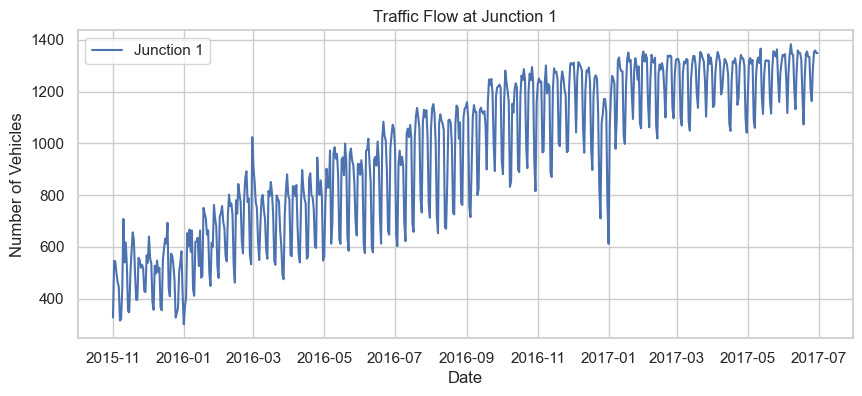

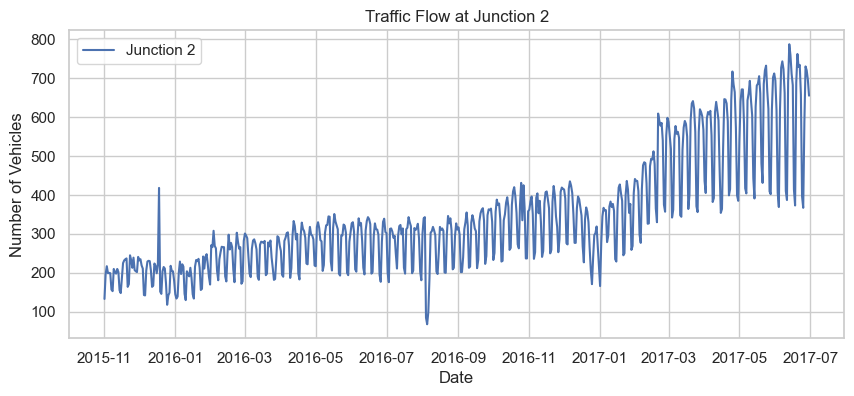

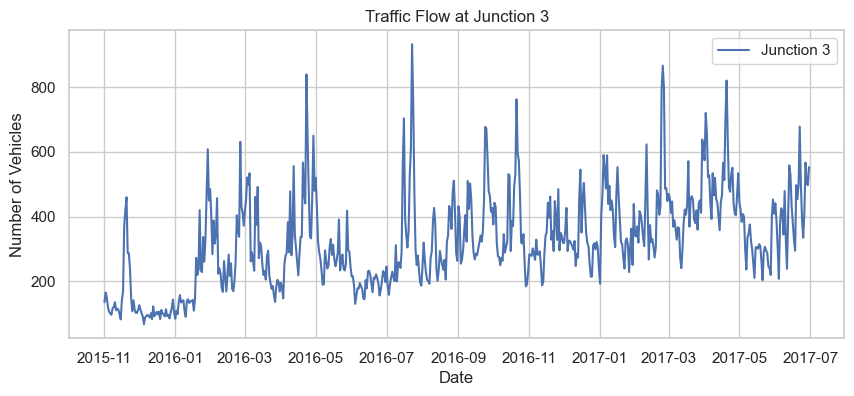

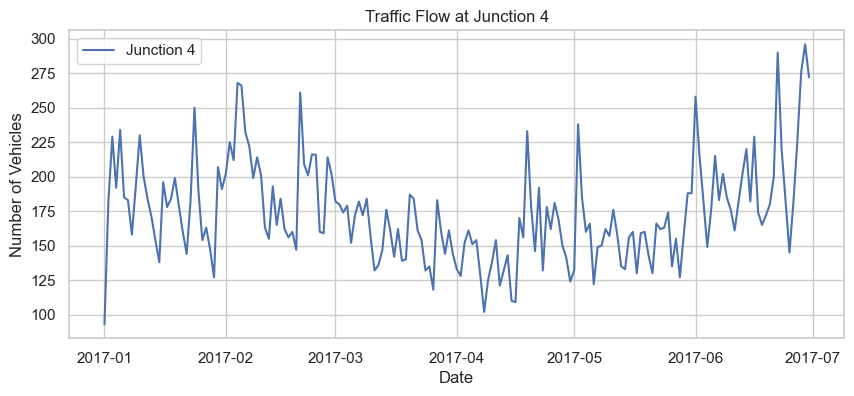

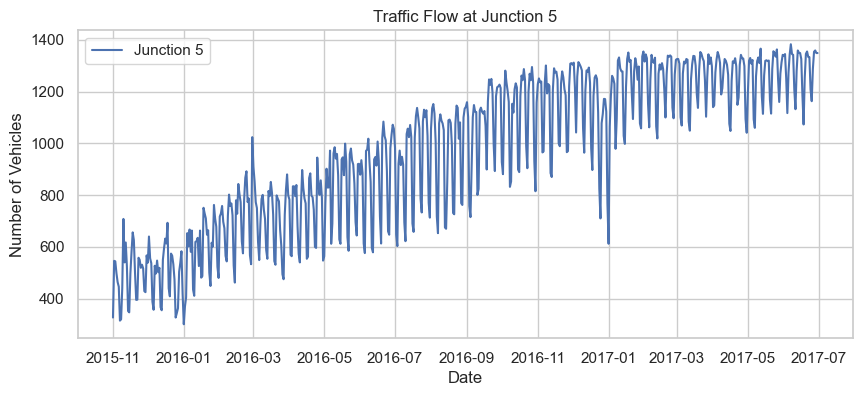

...

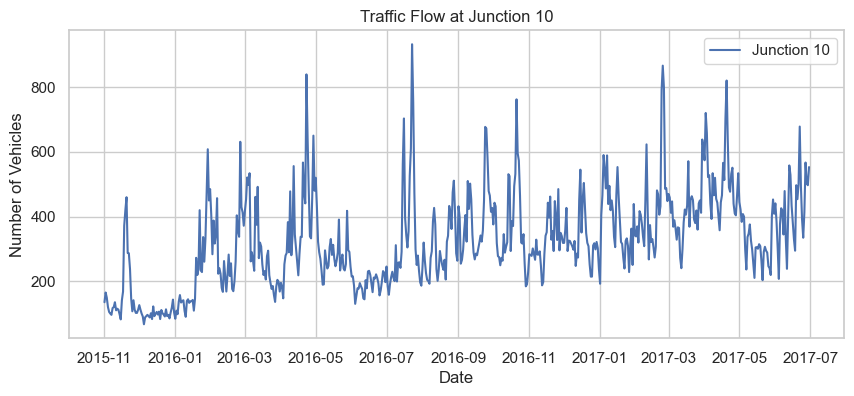

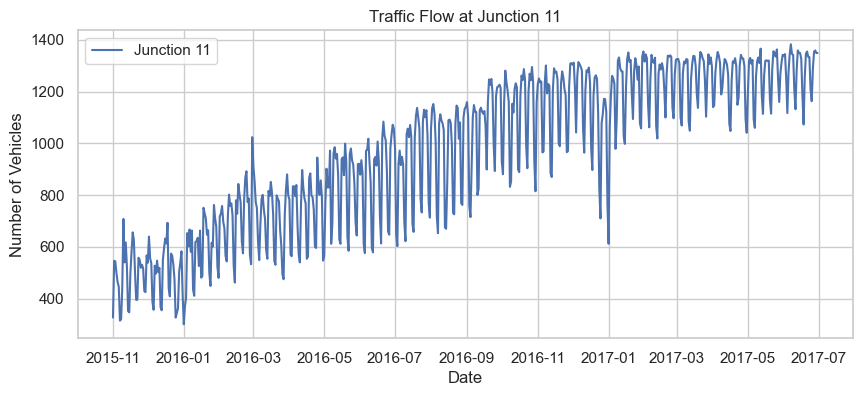

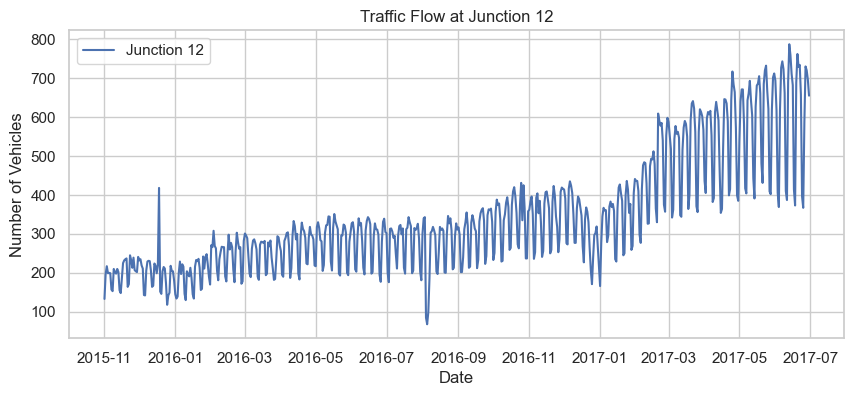

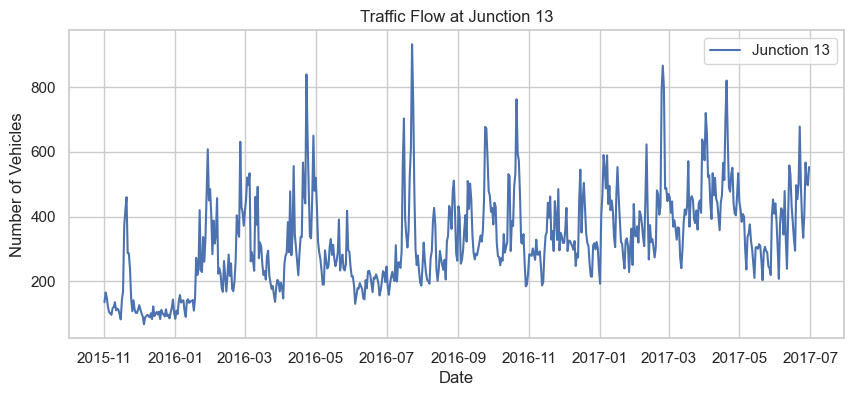

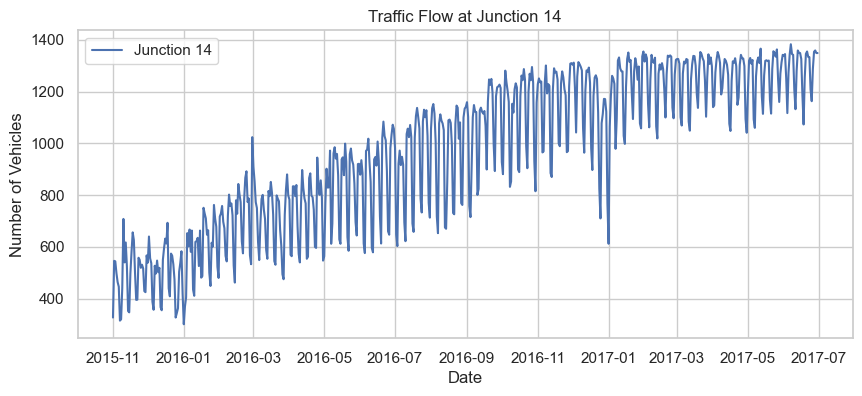

In [35]:
# Loop through each junction and plot its time series
for junction in junctions:
    plt.figure(figsize=(10, 4))
    subset = final_data[final_data['Junction'] == junction]  # Filter data for the junction

    plt.plot(subset.index, subset['Vehicles'], label=f'Junction {junction}', color='b')
    plt.xlabel('Date')
    plt.ylabel('Number of Vehicles')
    plt.title(f'Traffic Flow at Junction {junction}')
    plt.legend()
    plt.grid(True)
    
    plt.show()  # Show plot for each junction

## Time Series Decomposition

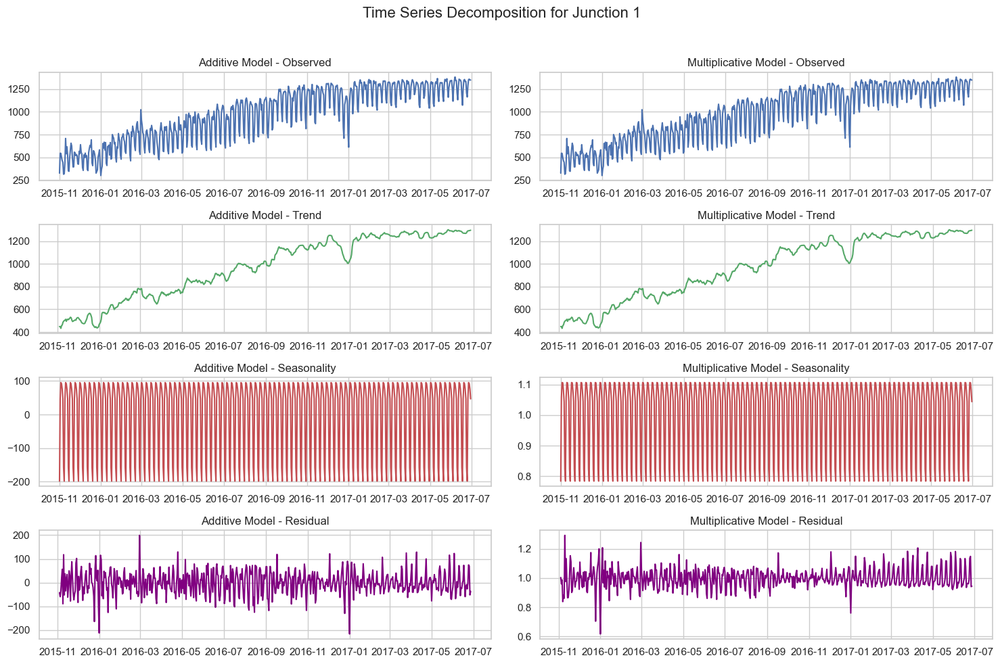

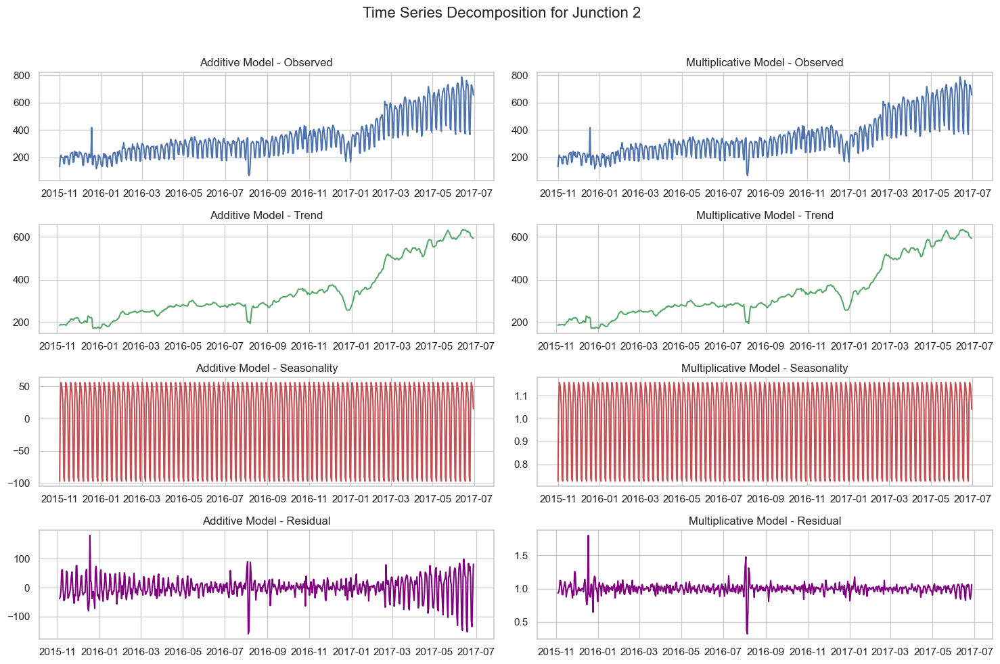

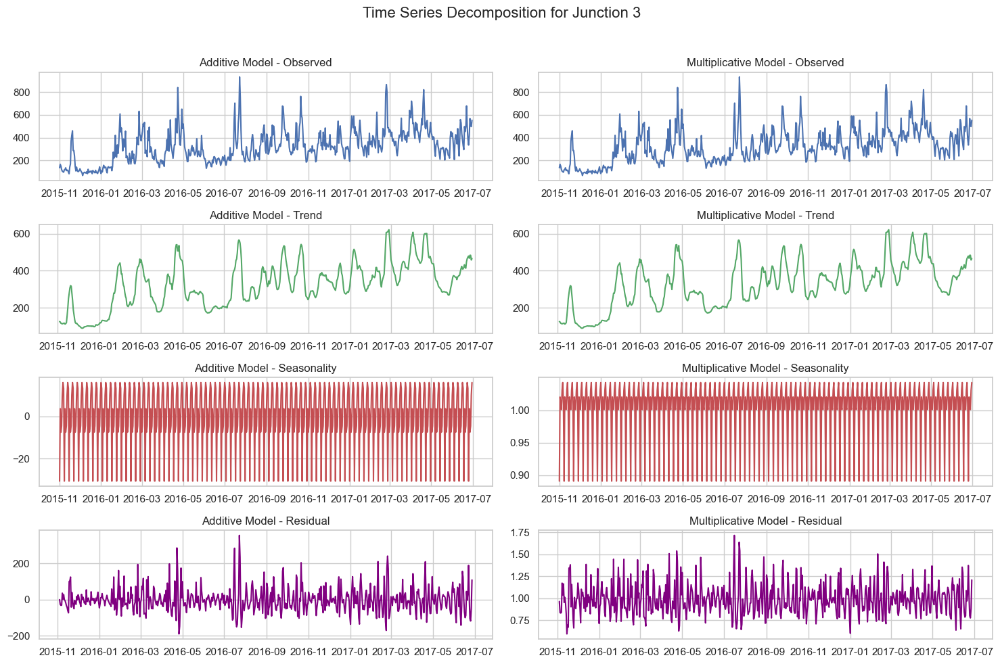

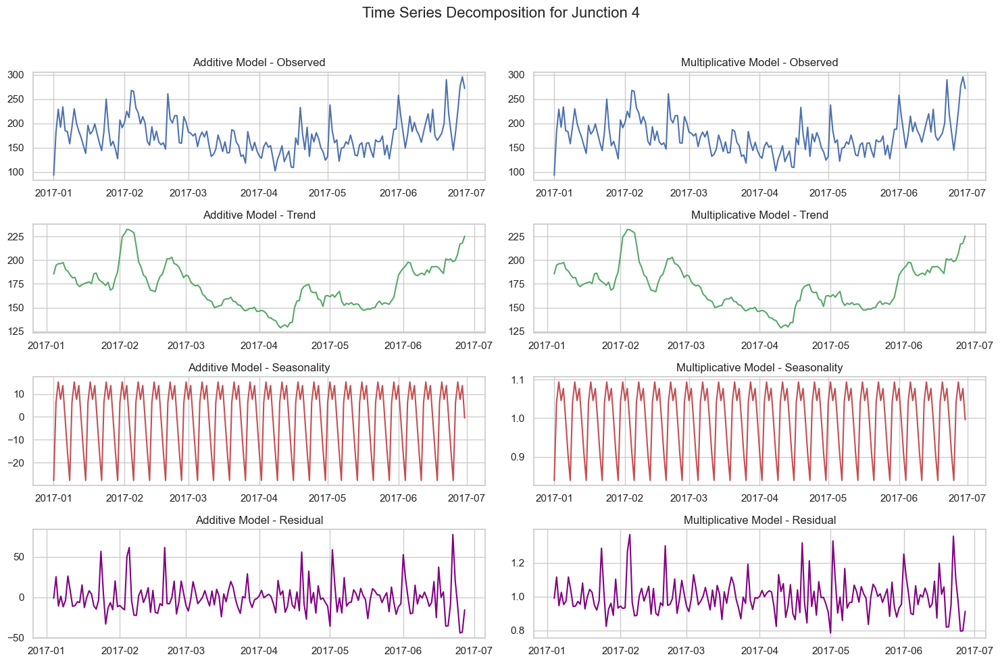

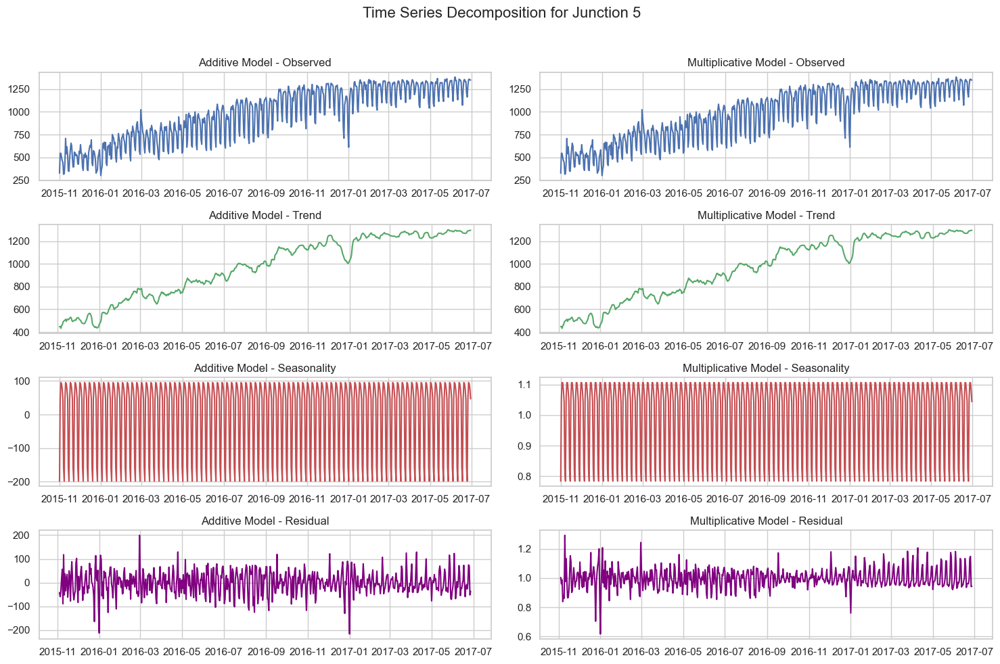

...

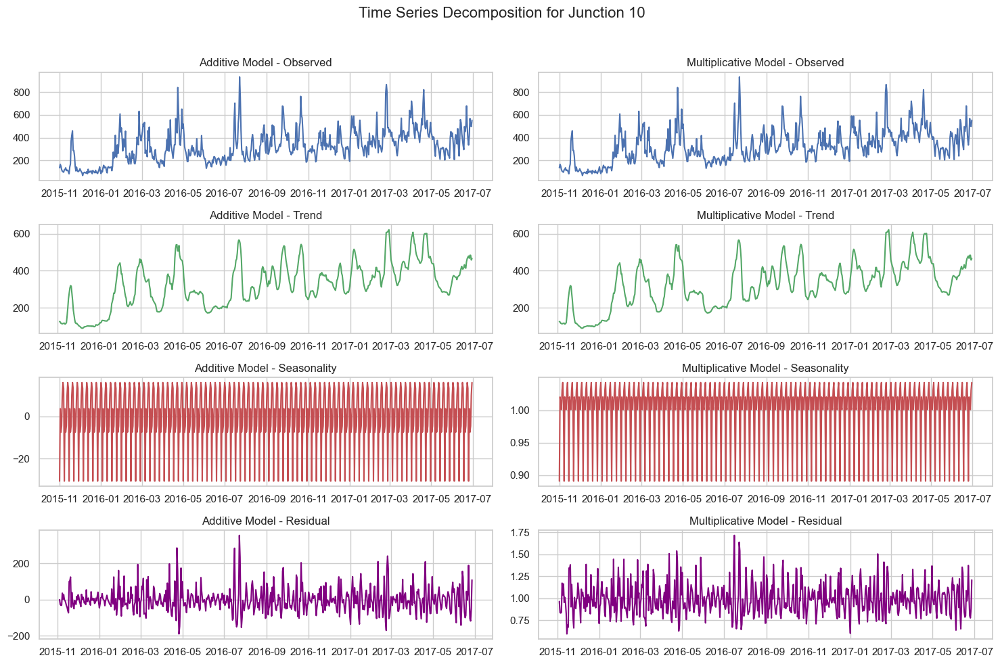

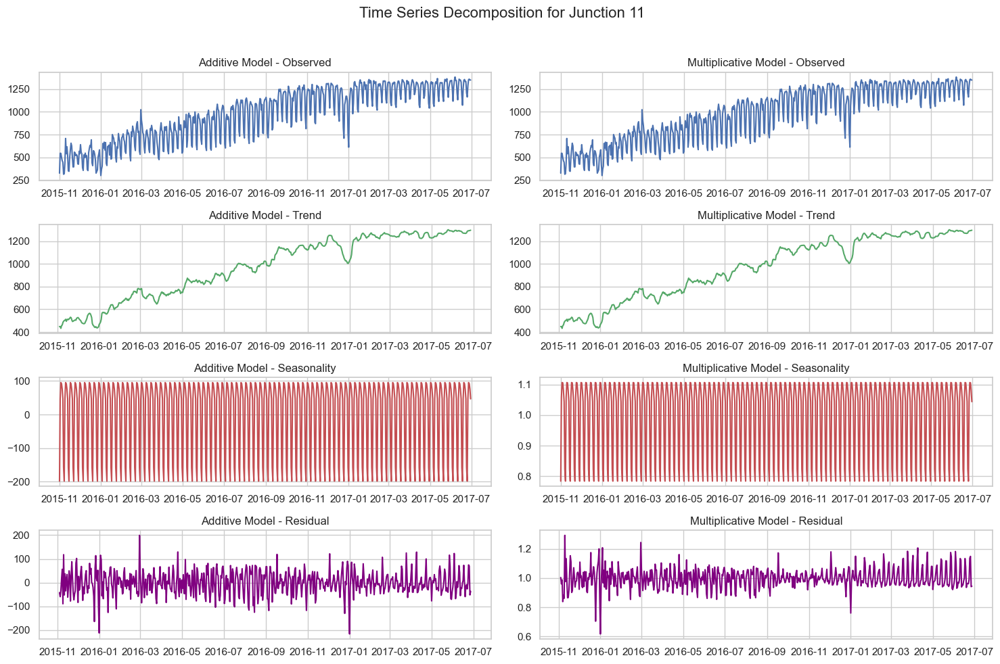

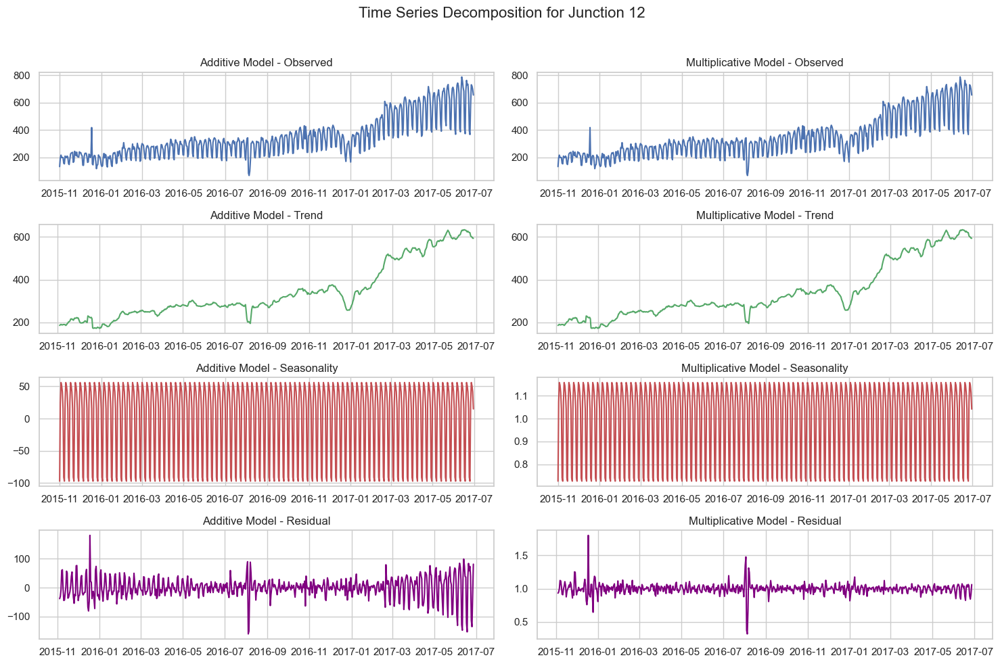

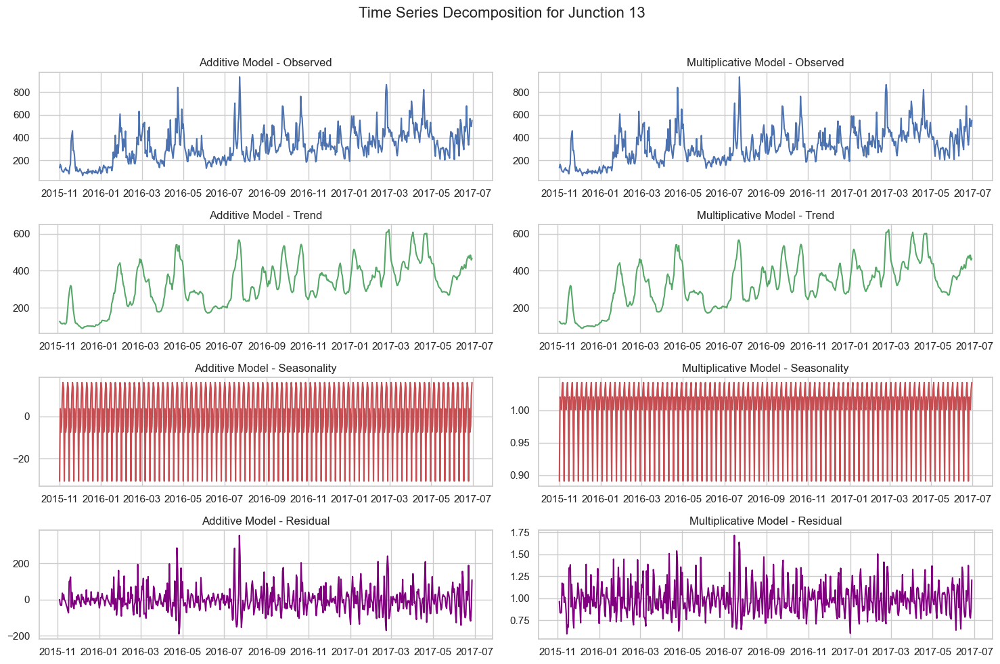

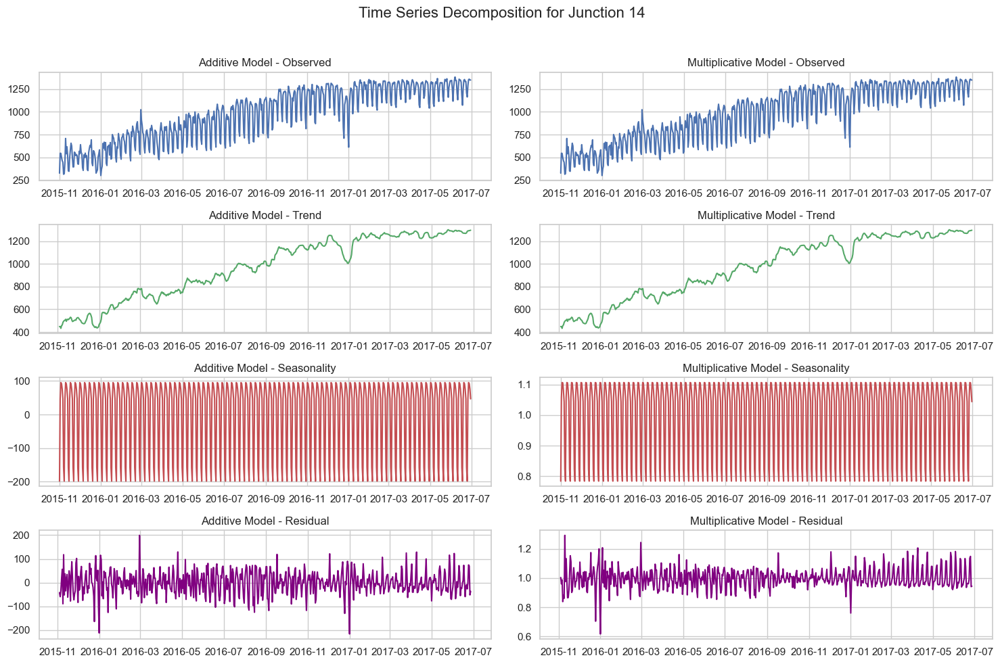

In [36]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Set plot style
sns.set_style("whitegrid")

# Loop through each junction and perform decomposition
for junction in junctions:
    subset = final_data[final_data['Junction'] == junction]  # Filter data for the junction
    
    # Perform additive decomposition
    decomposition_add = seasonal_decompose(subset['Vehicles'], model='additive', period=7)
    
    # Perform multiplicative decomposition
    decomposition_mul = seasonal_decompose(subset['Vehicles'], model='multiplicative', period=7)
    
    # Plot the results
    fig, axes = plt.subplots(4, 2, figsize=(15, 10))  # 4 rows (Original, Trend, Seasonality, Residual), 2 columns
    
    # Titles for each component
    components = ["Observed", "Trend", "Seasonality", "Residual"]
    
    # Plot Additive Components
    axes[0, 0].plot(subset.index, decomposition_add.observed, label="Observed", color='b')
    axes[1, 0].plot(subset.index, decomposition_add.trend, label="Trend", color='g')
    axes[2, 0].plot(subset.index, decomposition_add.seasonal, label="Seasonality", color='r')
    axes[3, 0].plot(subset.index, decomposition_add.resid, label="Residual", color='purple')
    
    # Plot Multiplicative Components
    axes[0, 1].plot(subset.index, decomposition_mul.observed, label="Observed", color='b')
    axes[1, 1].plot(subset.index, decomposition_mul.trend, label="Trend", color='g')
    axes[2, 1].plot(subset.index, decomposition_mul.seasonal, label="Seasonality", color='r')
    axes[3, 1].plot(subset.index, decomposition_mul.resid, label="Residual", color='purple')
    
    # Set Titles
    for i in range(4):
        axes[i, 0].set_title(f"Additive Model - {components[i]}")
        axes[i, 1].set_title(f"Multiplicative Model - {components[i]}")
    
    # Adjust layout and show plot
    plt.suptitle(f"Time Series Decomposition for Junction {junction}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])  
    plt.show()


## ACF (Autocorrelation Function) and PACF (Partial Autocorrelation Function)

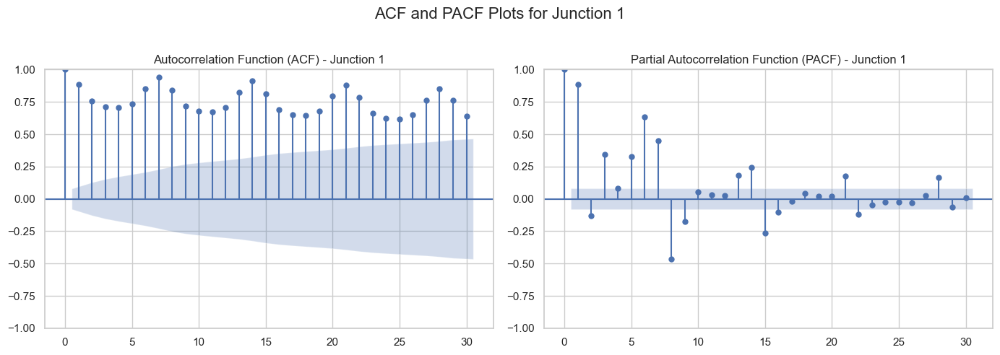

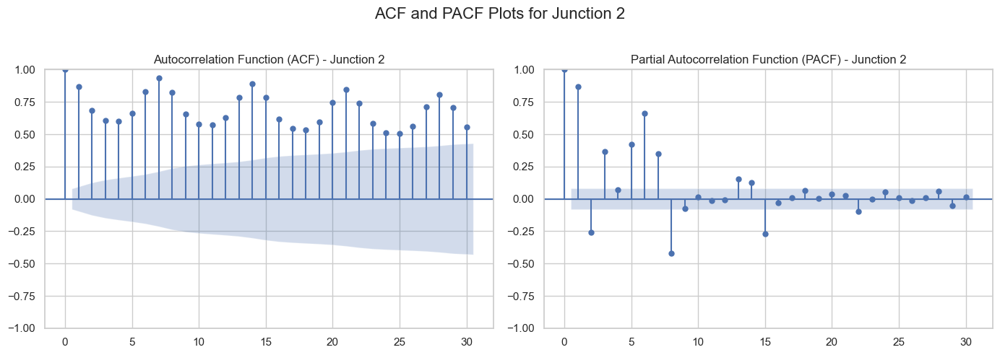

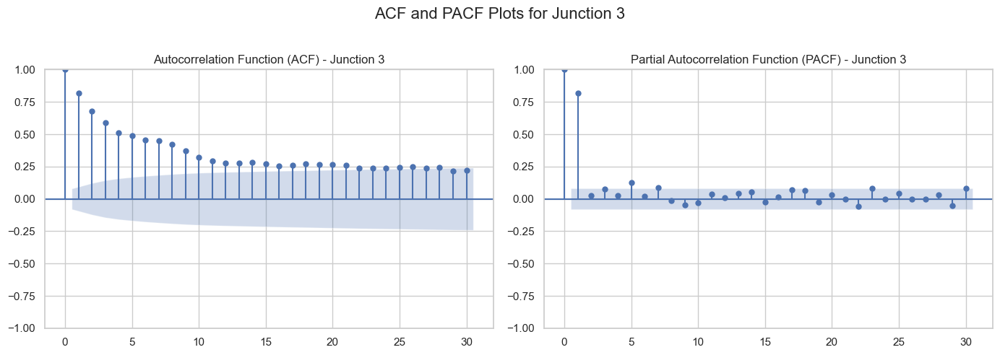

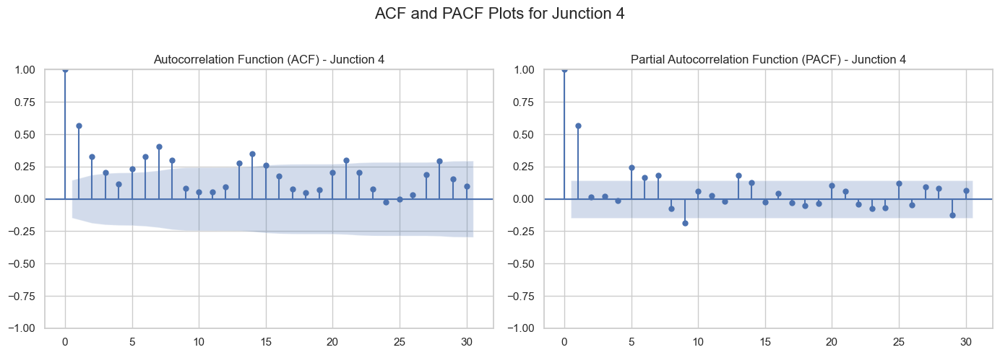

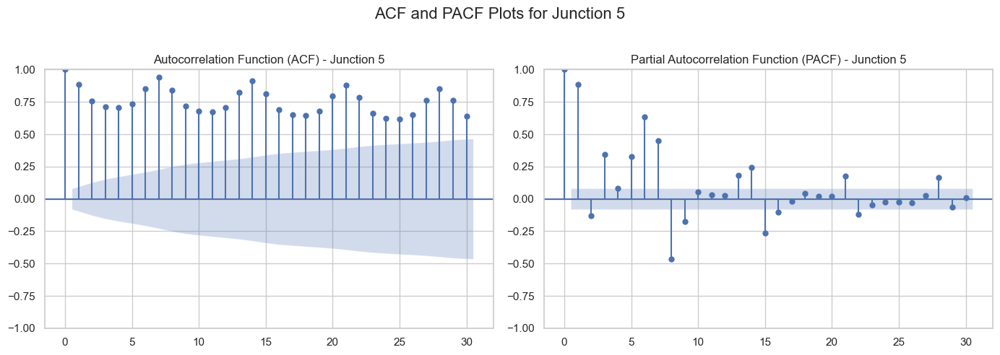

...

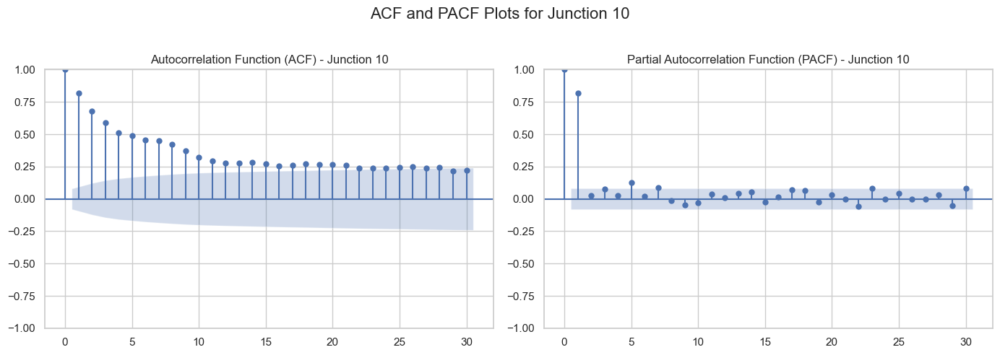

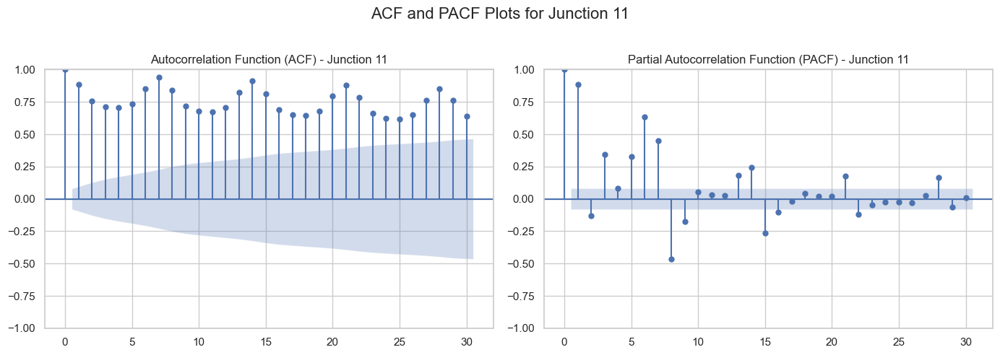

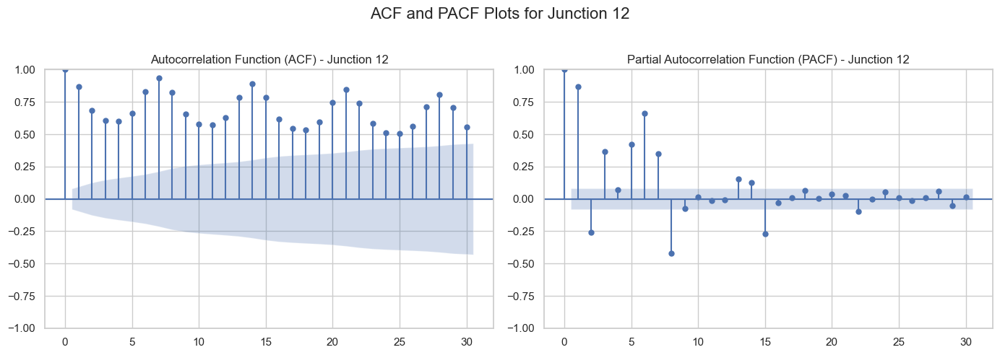

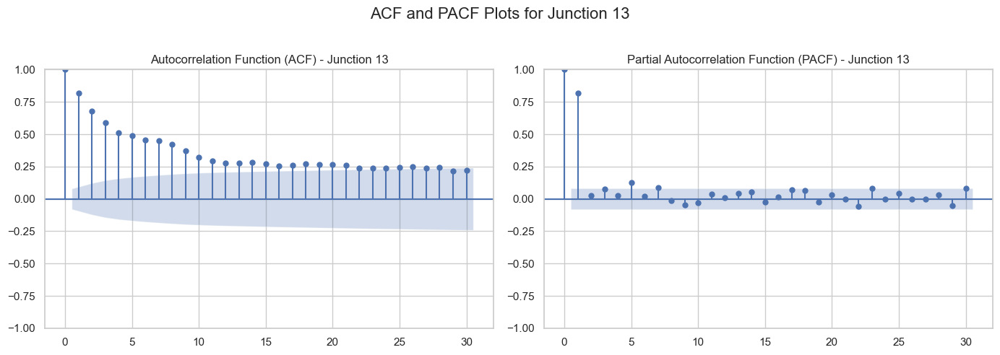

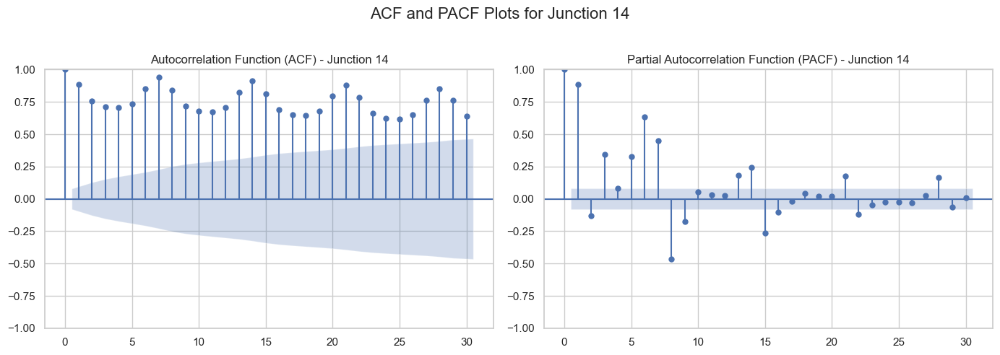

In [37]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Set plot style
sns.set_style("whitegrid")

# Loop through each junction and plot ACF & PACF
for junction in junctions:
    subset = final_data[final_data['Junction'] == junction]  # Filter data for the junction
    
    # Create subplots for ACF and PACF
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))  # 1 row, 2 columns

    # Plot ACF
    plot_acf(subset['Vehicles'], lags=30, ax=axes[0])
    axes[0].set_title(f"Autocorrelation Function (ACF) - Junction {junction}")

    # Plot PACF
    plot_pacf(subset['Vehicles'], lags=30, ax=axes[1])
    axes[1].set_title(f"Partial Autocorrelation Function (PACF) - Junction {junction}")

    # Adjust layout and show plot
    plt.suptitle(f"ACF and PACF Plots for Junction {junction}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])  
    plt.show()


## Ljung Box test for white noise

In [38]:
from statsmodels.stats.diagnostic import acorr_ljungbox

# Set plot style
sns.set_style("whitegrid")

# Loop through each junction and perform the Ljung-Box test
for junction in junctions:
    subset = final_data[final_data['Junction'] == junction]  # Filter data for the junction
    
    # Perform Ljung-Box test (lags=10)
    lb_test = acorr_ljungbox(subset['Vehicles'], lags=[10], return_df=True)
    
    # Display results
    print(f"\nLjung-Box Test for Junction {junction}")
    print(lb_test)



Ljung-Box Test for Junction 1
        lb_stat  lb_pvalue
10  3815.047316        0.0

Ljung-Box Test for Junction 2
        lb_stat  lb_pvalue
10  3318.385442        0.0

Ljung-Box Test for Junction 3
       lb_stat  lb_pvalue
10  1725.25999        0.0

Ljung-Box Test for Junction 4
       lb_stat     lb_pvalue
10  169.932717  2.864444e-31

Ljung-Box Test for Junction 5
        lb_stat  lb_pvalue
10  3815.047316        0.0

Ljung-Box Test for Junction 6
        lb_stat  lb_pvalue
10  3318.385442        0.0

Ljung-Box Test for Junction 7
       lb_stat  lb_pvalue
10  1725.25999        0.0

Ljung-Box Test for Junction 8
        lb_stat  lb_pvalue
10  3815.047316        0.0

Ljung-Box Test for Junction 9
        lb_stat  lb_pvalue
10  3318.385442        0.0

Ljung-Box Test for Junction 10
       lb_stat  lb_pvalue
10  1725.25999        0.0

Ljung-Box Test for Junction 11
        lb_stat  lb_pvalue
10  3815.047316        0.0

Ljung-Box Test for Junction 12
        lb_stat  lb_pvalue
10  33

## ADF test - weak stationarity test

In [39]:
from statsmodels.tsa.stattools import adfuller

for junction in junctions:
    subset = final_data[final_data['Junction'] == junction]  # Filter data

    # Perform ADF test with automatic lag selection
    adf_test = adfuller(subset['Vehicles'], autolag='AIC')

    print(f"\nADF Test for Junction {junction}:")
    print(f"ADF Statistic: {adf_test[0]}")
    print(f"P-value: {adf_test[1]}")
    print(f"Critical Values: {adf_test[4]}")



ADF Test for Junction 1:
ADF Statistic: -1.4321736193896286
P-value: 0.5667582279773763
Critical Values: {'1%': -3.441444394224128, '5%': -2.8664345376276454, '10%': -2.569376663737217}

ADF Test for Junction 2:
ADF Statistic: 0.4241987866413816
P-value: 0.9823776788457994
Critical Values: {'1%': -3.44152019959894, '5%': -2.8664679191981297, '10%': -2.569394451038919}

ADF Test for Junction 3:
ADF Statistic: -4.407027220608899
P-value: 0.000288446960297219
Critical Values: {'1%': -3.441277537487585, '5%': -2.8663610578661083, '10%': -2.5693375106104357}

ADF Test for Junction 4:
ADF Statistic: -0.7495829454576912
P-value: 0.8334851799444843
Critical Values: {'1%': -3.470126426071447, '5%': -2.8790075987120027, '10%': -2.5760826967621644}

ADF Test for Junction 5:
ADF Statistic: -1.4321736193896286
P-value: 0.5667582279773763
Critical Values: {'1%': -3.441444394224128, '5%': -2.8664345376276454, '10%': -2.569376663737217}

ADF Test for Junction 6:
ADF Statistic: 0.4241987866413816
P-va

## KPSS Test - weak stationary test

In [40]:
from statsmodels.tsa.stattools import kpss

for junction in junctions:
    subset = final_data[final_data['Junction'] == junction]  # Filter data

    # Perform KPSS test with automatic lag selection
    kpss_test = kpss(subset['Vehicles'], regression='c', nlags='auto')

    print(f"\nKPSS Test for Junction {junction}:")
    print(f"Test Statistic: {kpss_test[0]}")
    print(f"P-value: {kpss_test[1]}")
    print(f"Critical Values: {kpss_test[3]}")


KPSS Test for Junction 1:
Test Statistic: 3.7490749287349656
P-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}

KPSS Test for Junction 2:
Test Statistic: 3.236000220015154
P-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}

KPSS Test for Junction 3:
Test Statistic: 1.9111028466695383
P-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}

KPSS Test for Junction 4:
Test Statistic: 0.37111010047979404
P-value: 0.0896077153104336
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}

KPSS Test for Junction 5:
Test Statistic: 3.7490749287349656
P-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}

KPSS Test for Junction 6:
Test Statistic: 3.236000220015154
P-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}

KPSS Test for Junction 7:
Test Statistic: 1.9111028466695383
P-value: 0.01
Critical Values: 

Junction 1: Applied 1 order differencing to achieve stationarity.


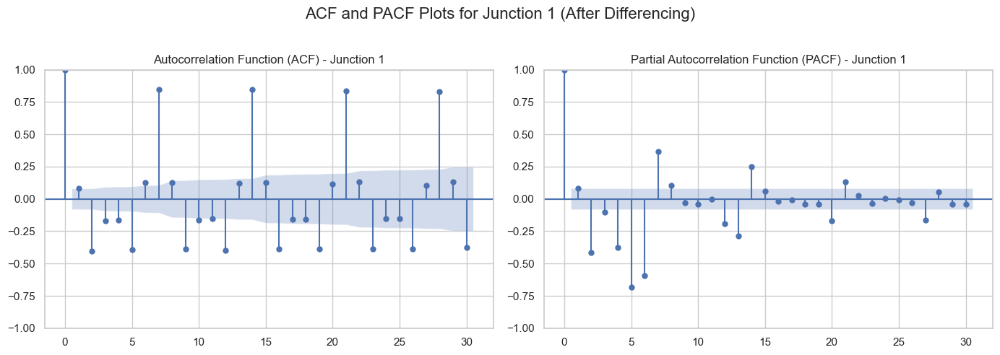

Junction 2: Applied 1 order differencing to achieve stationarity.


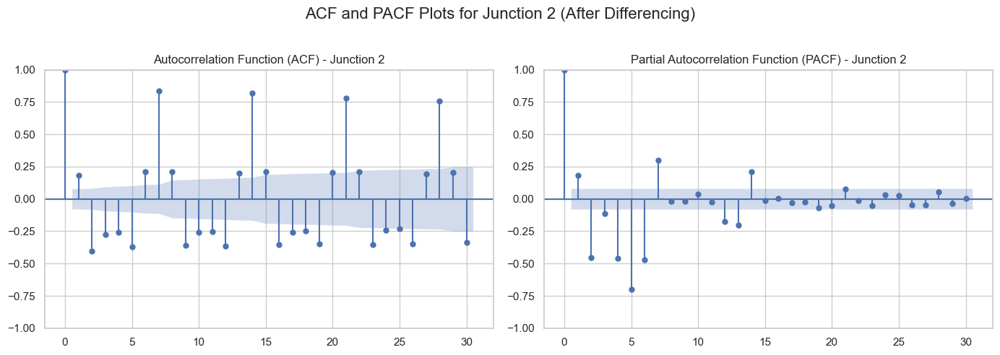

Junction 3: Applied 0 order differencing to achieve stationarity.


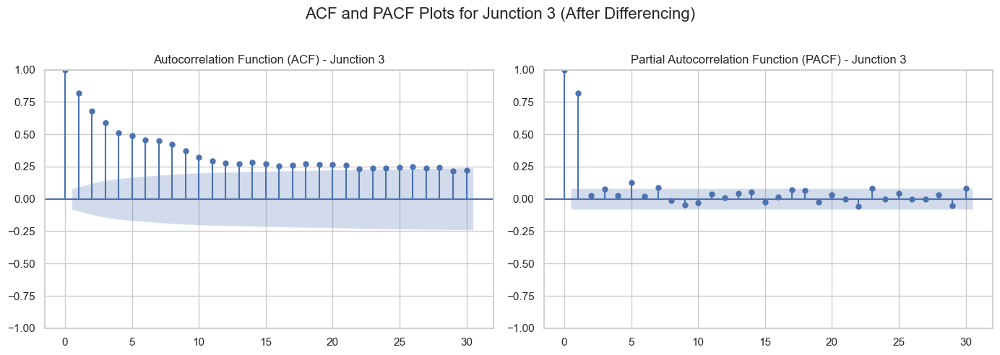

Junction 4: Applied 1 order differencing to achieve stationarity.


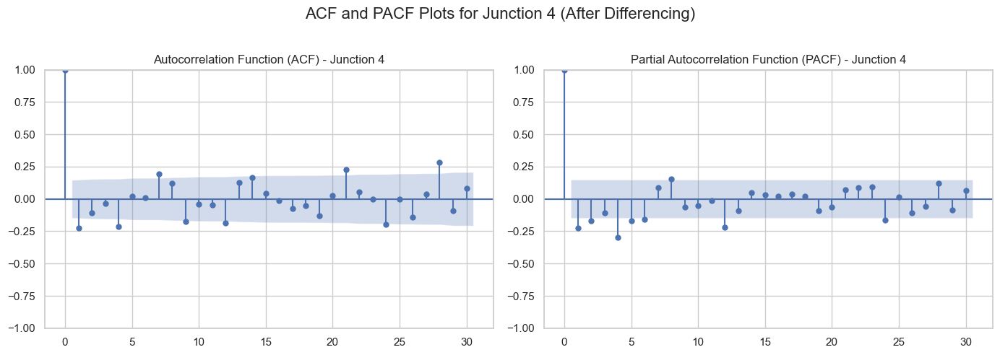

Junction 5: Applied 1 order differencing to achieve stationarity.


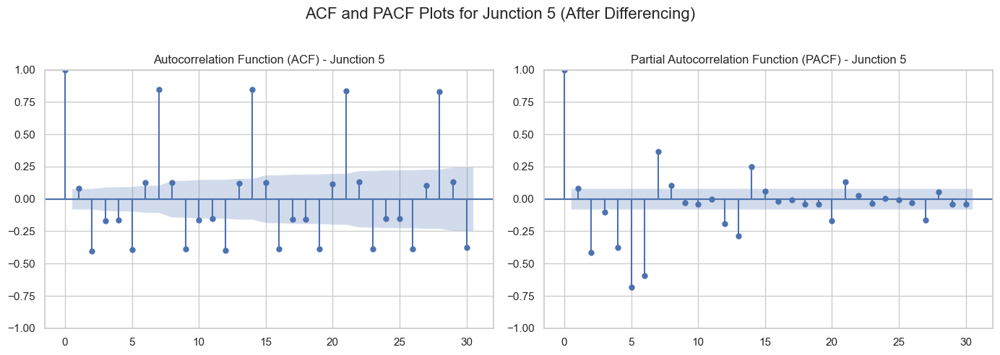

Junction 6: Applied 1 order differencing to achieve stationarity.


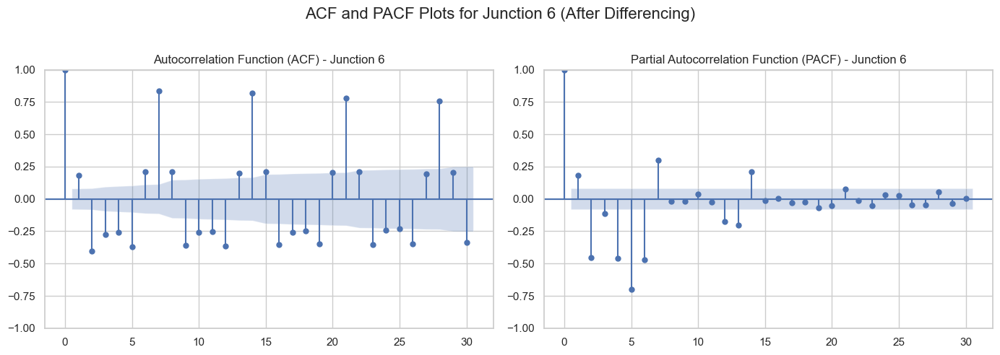

Junction 7: Applied 0 order differencing to achieve stationarity.


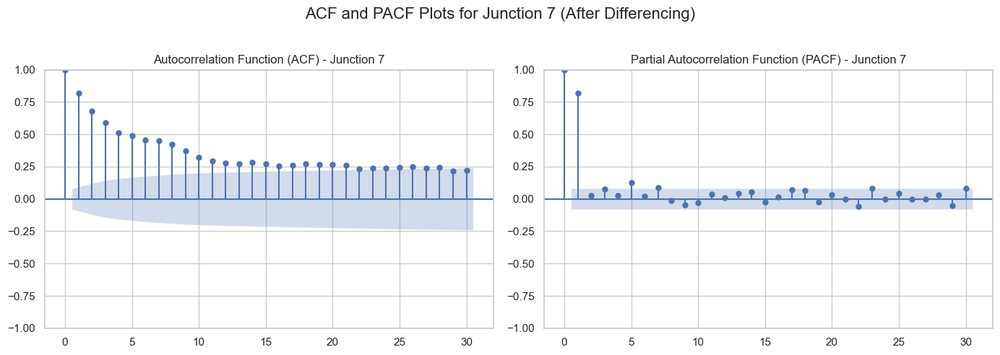

Junction 8: Applied 1 order differencing to achieve stationarity.


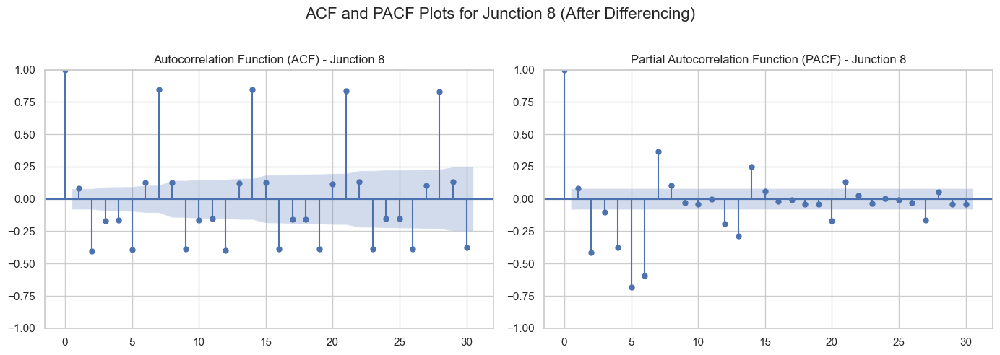

Junction 9: Applied 1 order differencing to achieve stationarity.


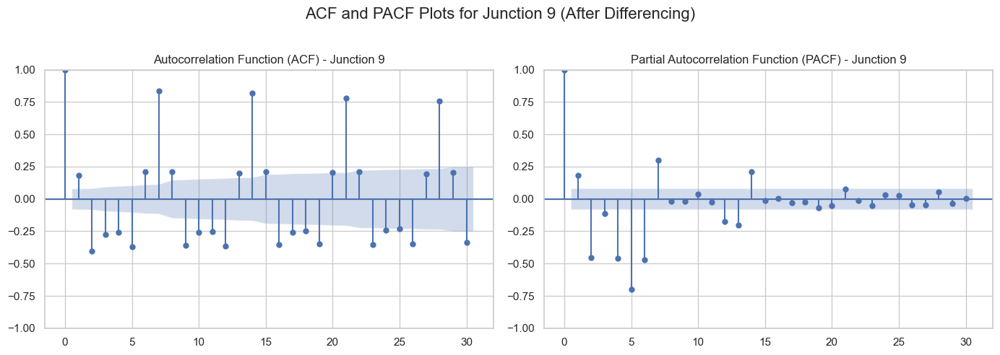

Junction 10: Applied 0 order differencing to achieve stationarity.


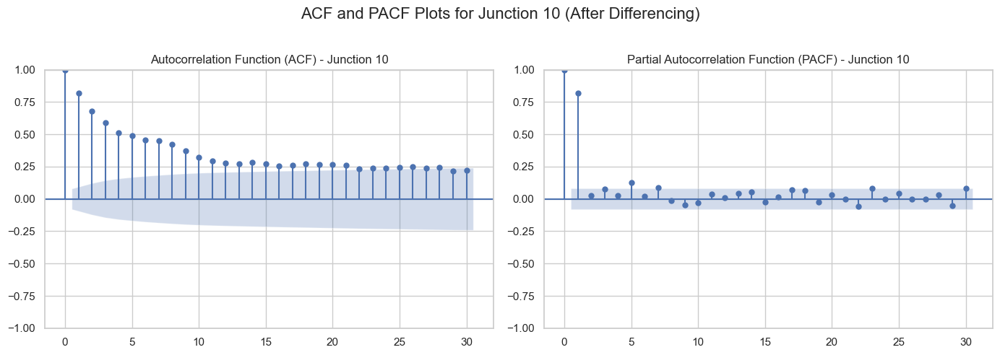

Junction 11: Applied 1 order differencing to achieve stationarity.


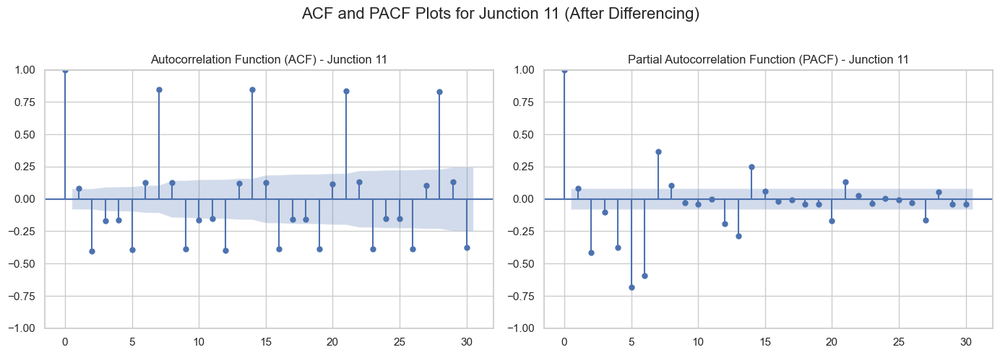

Junction 12: Applied 1 order differencing to achieve stationarity.


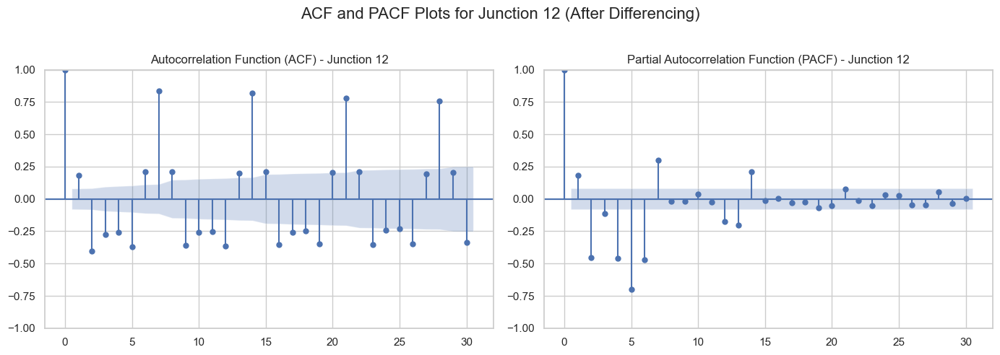

Junction 13: Applied 0 order differencing to achieve stationarity.


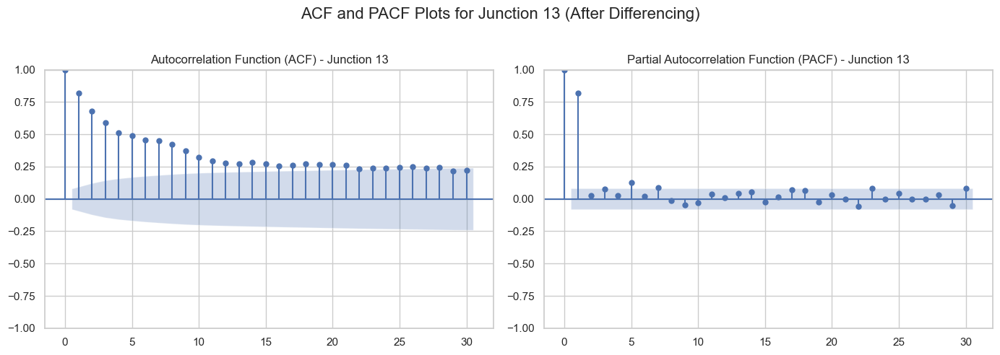

Junction 14: Applied 1 order differencing to achieve stationarity.


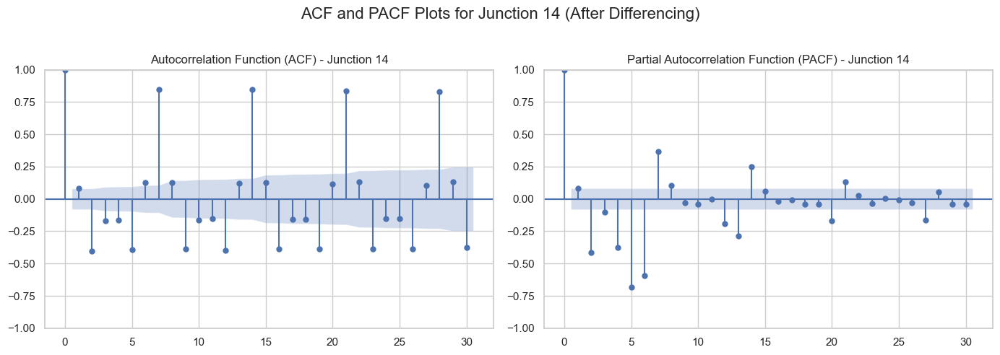

In [41]:
# Set plot style
sns.set_style("whitegrid")

# Function to check stationarity using ADF test
def check_stationarity(series):
    result = adfuller(series.dropna())  # Drop NaN values
    return result[1] < 0.05  # Stationary if p-value < 0.05

# Function to perform differencing until stationarity
def make_stationary(series):
    diff_series = series.copy()
    d = 0  # Differencing order

    while not check_stationarity(diff_series) and d < 5:  # Limit differencing to 5
        diff_series = diff_series.diff().dropna()
        d += 1
    
    return diff_series, d

# Loop through each junction, apply differencing, and plot ACF & PACF
for junction in junctions:
    subset = final_data[final_data['Junction'] == junction]  # Filter data for the junction
    
    # Perform differencing until stationary
    stationary_series, d = make_stationary(subset['Vehicles'])

    print(f"Junction {junction}: Applied {d} order differencing to achieve stationarity.")

    # Create subplots for ACF and PACF
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))  # 1 row, 2 columns

    # Plot ACF
    plot_acf(stationary_series, lags=30, ax=axes[0])
    axes[0].set_title(f"Autocorrelation Function (ACF) - Junction {junction}")

    # Plot PACF
    plot_pacf(stationary_series, lags=30, ax=axes[1])
    axes[1].set_title(f"Partial Autocorrelation Function (PACF) - Junction {junction}")

    # Adjust layout and show plot
    plt.suptitle(f"ACF and PACF Plots for Junction {junction} (After Differencing)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])  
    plt.show()


## Sequential Forecasting


Processing Junction 1...
Using Seasonality Period (m): 7
Selected SARIMA Model: (p,d,q)=(6,1,0), (P,D,Q,s)=(2,0,1,7)
Junction 1: MAPE: 4.92%, Accuracy: 95.08%


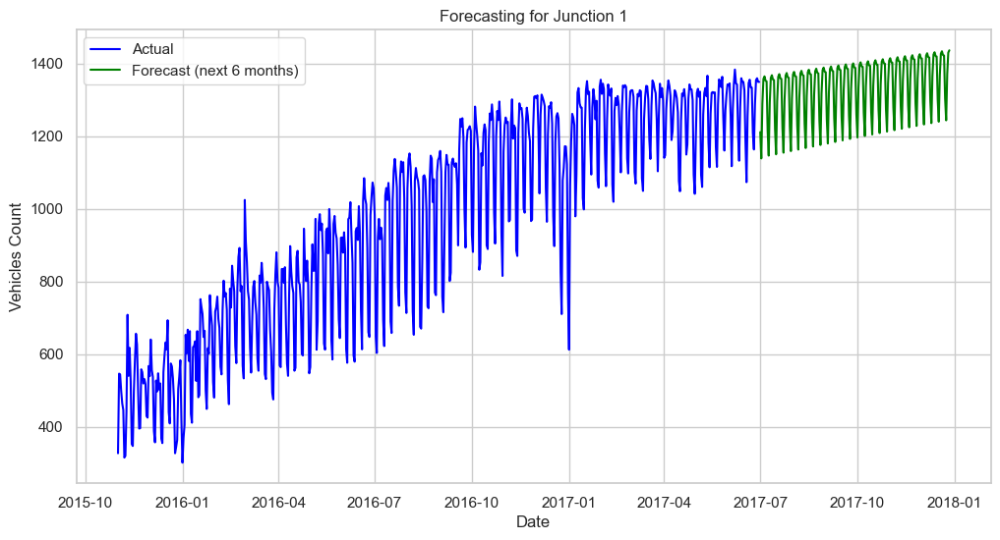


Processing Junction 2...
Using Seasonality Period (m): 7
Selected SARIMA Model: (p,d,q)=(5,1,1), (P,D,Q,s)=(1,0,1,7)
Junction 2: MAPE: 5.15%, Accuracy: 94.85%


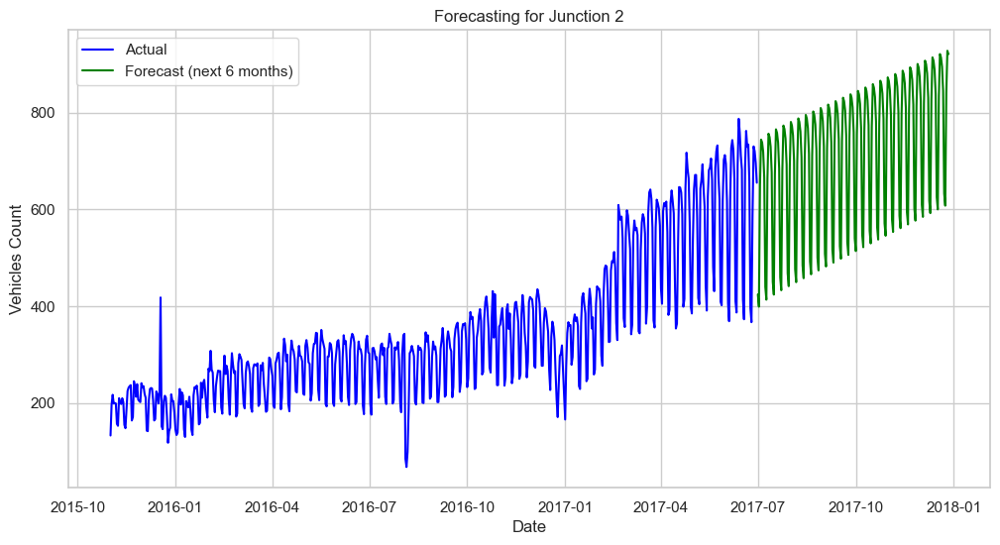


Processing Junction 3...
Using Seasonality Period (m): No Seasonality
Selected SARIMA Model: (p,d,q)=(2,1,2), (P,D,Q,s)=(0,0,0,0)
Junction 3: MAPE: 23.73%, Accuracy: 76.27%


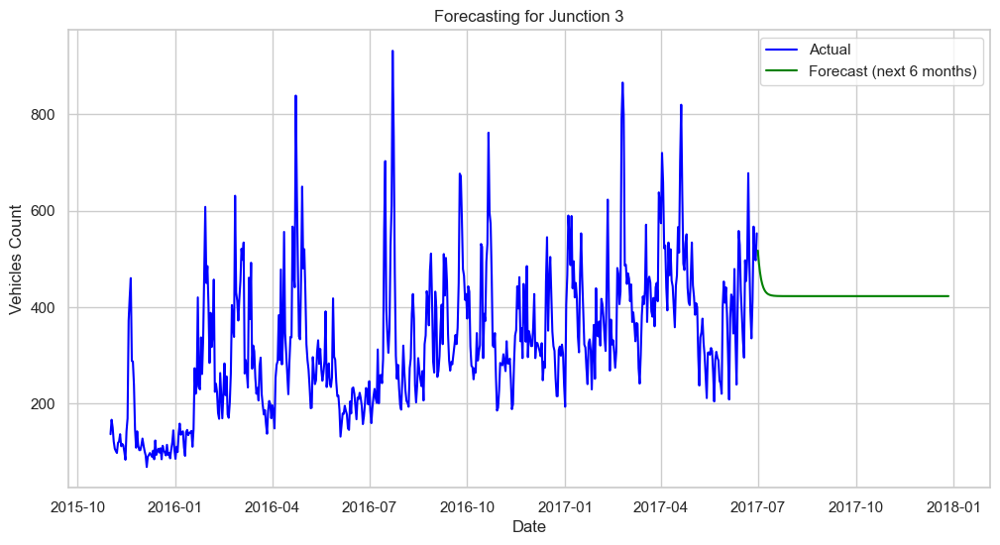


Processing Junction 4...
Using Seasonality Period (m): 7
Selected SARIMA Model: (p,d,q)=(1,1,1), (P,D,Q,s)=(1,0,1,7)
Junction 4: MAPE: 25.98%, Accuracy: 74.02%


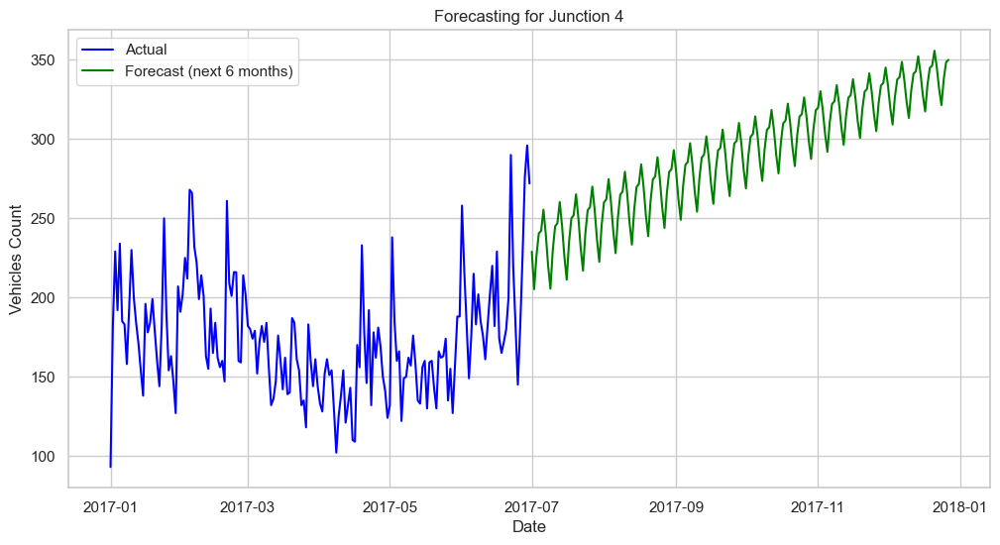


Processing Junction 5...
Using Seasonality Period (m): 7
Selected SARIMA Model: (p,d,q)=(6,1,0), (P,D,Q,s)=(2,0,1,7)
Junction 5: MAPE: 4.92%, Accuracy: 95.08%


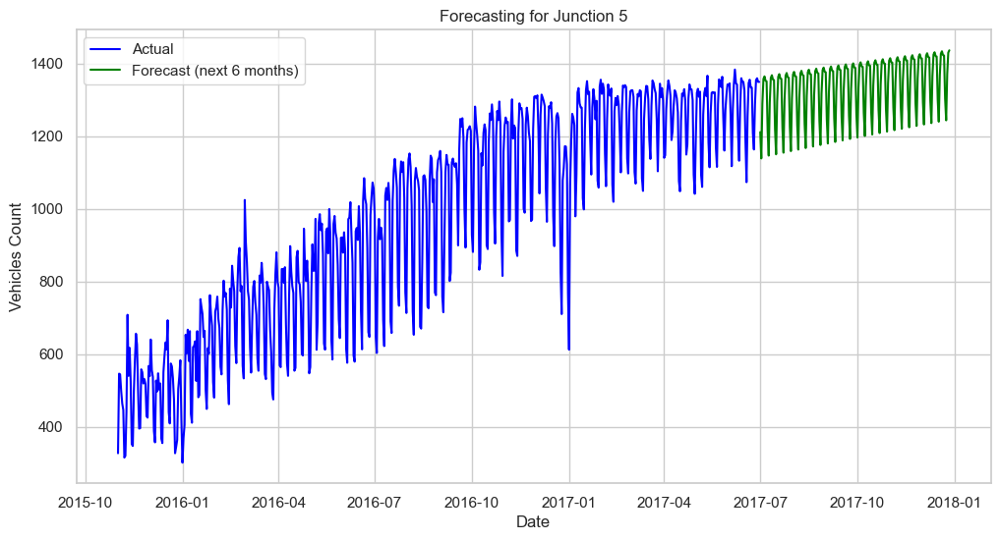


Processing Junction 6...
Using Seasonality Period (m): 7
Selected SARIMA Model: (p,d,q)=(5,1,1), (P,D,Q,s)=(1,0,1,7)
Junction 6: MAPE: 5.15%, Accuracy: 94.85%


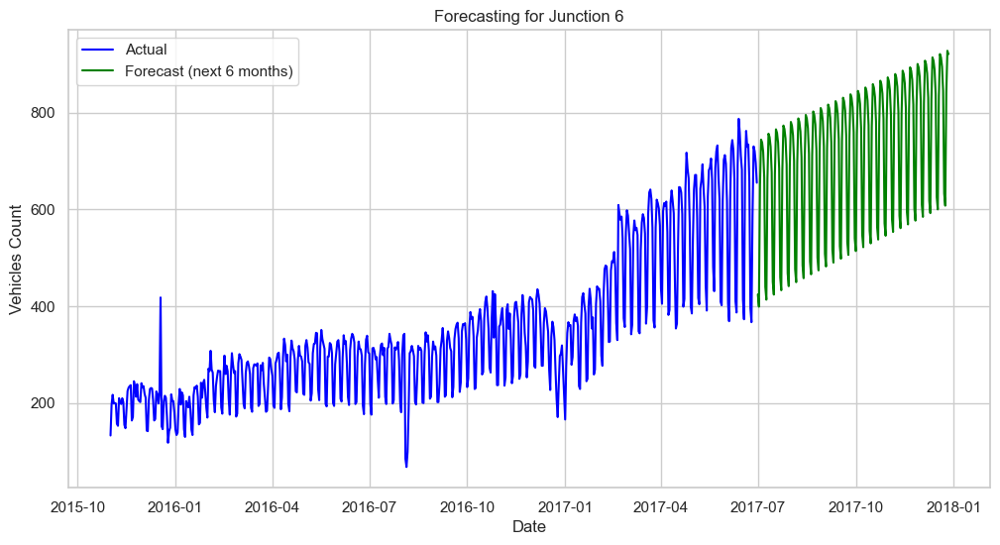


Processing Junction 7...
Using Seasonality Period (m): No Seasonality
Selected SARIMA Model: (p,d,q)=(2,1,2), (P,D,Q,s)=(0,0,0,0)
Junction 7: MAPE: 23.73%, Accuracy: 76.27%


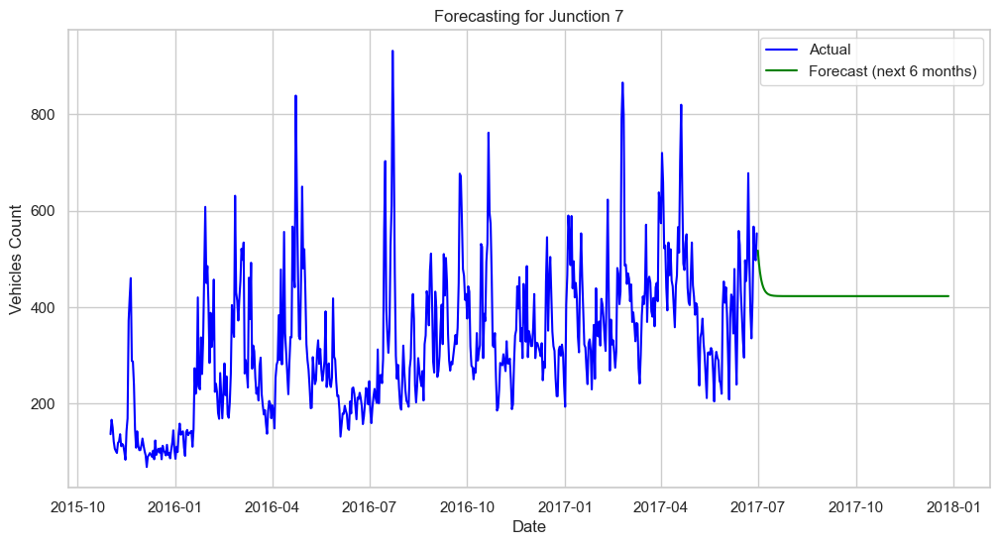


Processing Junction 8...
Using Seasonality Period (m): 7
Selected SARIMA Model: (p,d,q)=(6,1,0), (P,D,Q,s)=(2,0,1,7)
Junction 8: MAPE: 4.92%, Accuracy: 95.08%


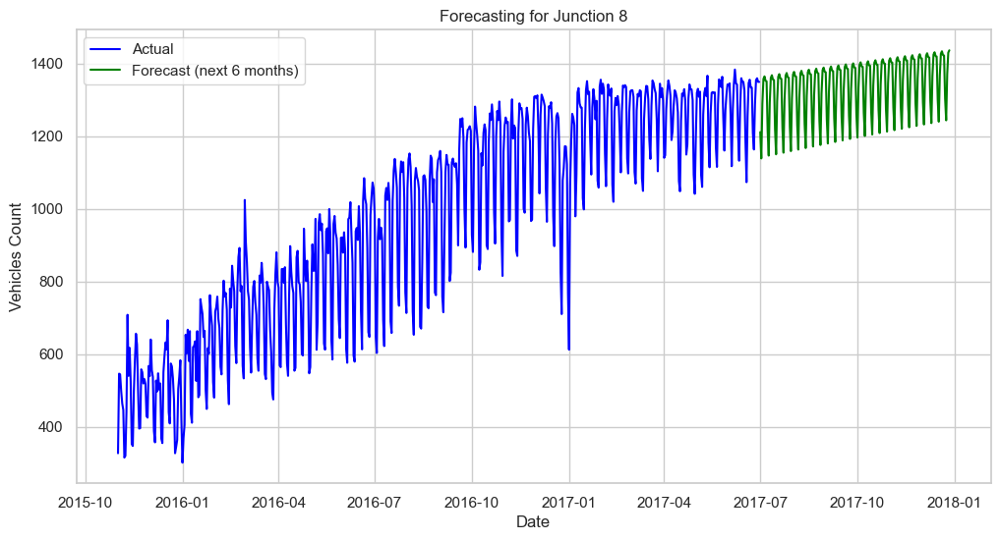


Processing Junction 9...
Using Seasonality Period (m): 7
Selected SARIMA Model: (p,d,q)=(5,1,1), (P,D,Q,s)=(1,0,1,7)
Junction 9: MAPE: 5.15%, Accuracy: 94.85%


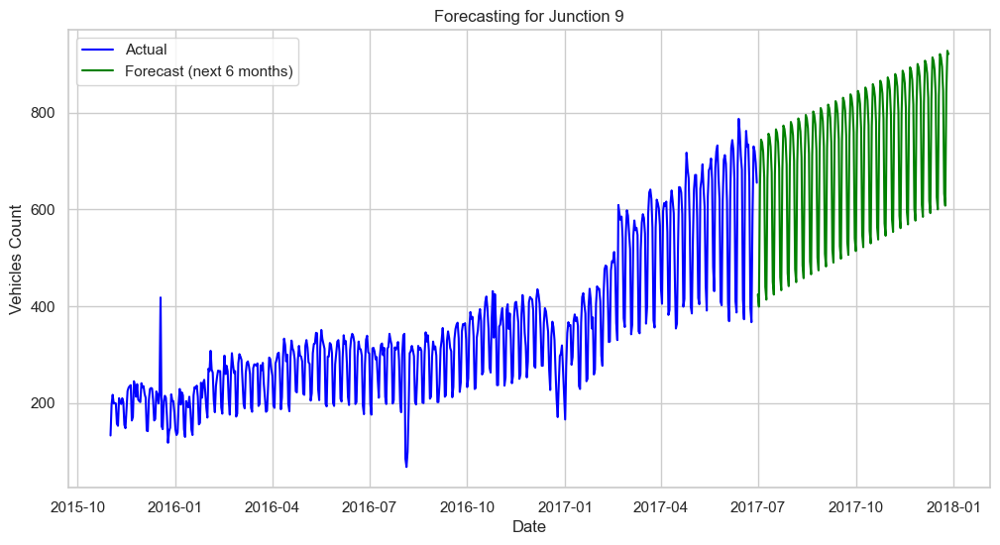


Processing Junction 10...
Using Seasonality Period (m): No Seasonality
Selected SARIMA Model: (p,d,q)=(2,1,2), (P,D,Q,s)=(0,0,0,0)
Junction 10: MAPE: 23.73%, Accuracy: 76.27%


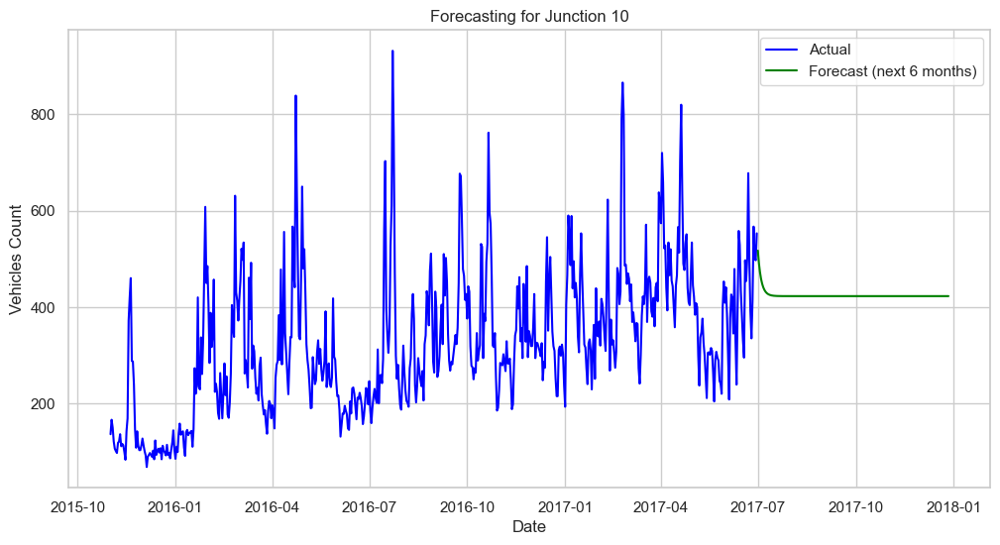


Processing Junction 11...
Using Seasonality Period (m): 7
Selected SARIMA Model: (p,d,q)=(6,1,0), (P,D,Q,s)=(2,0,1,7)
Junction 11: MAPE: 4.92%, Accuracy: 95.08%


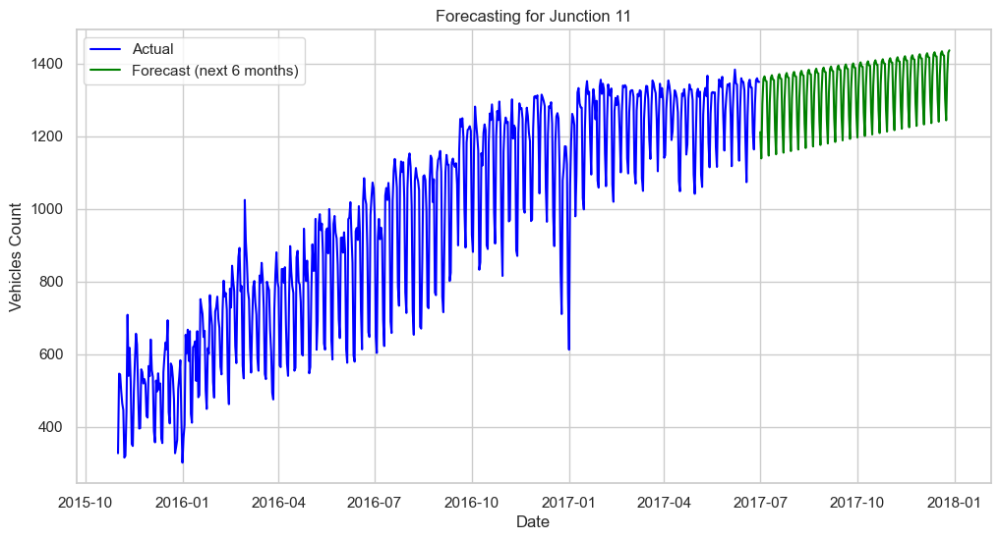


Processing Junction 12...
Using Seasonality Period (m): 7
Selected SARIMA Model: (p,d,q)=(5,1,1), (P,D,Q,s)=(1,0,1,7)
Junction 12: MAPE: 5.15%, Accuracy: 94.85%


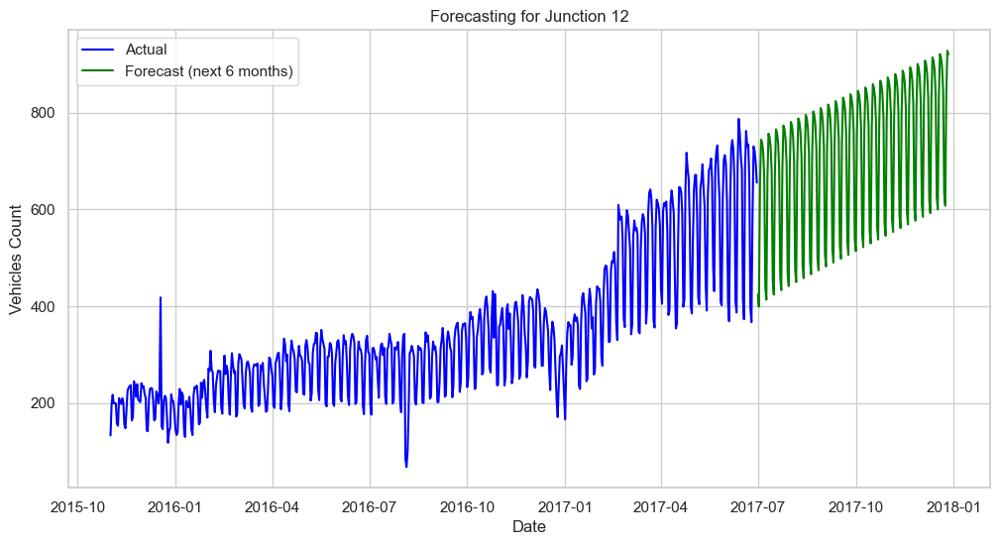


Processing Junction 13...
Using Seasonality Period (m): No Seasonality
Selected SARIMA Model: (p,d,q)=(2,1,2), (P,D,Q,s)=(0,0,0,0)
Junction 13: MAPE: 23.73%, Accuracy: 76.27%


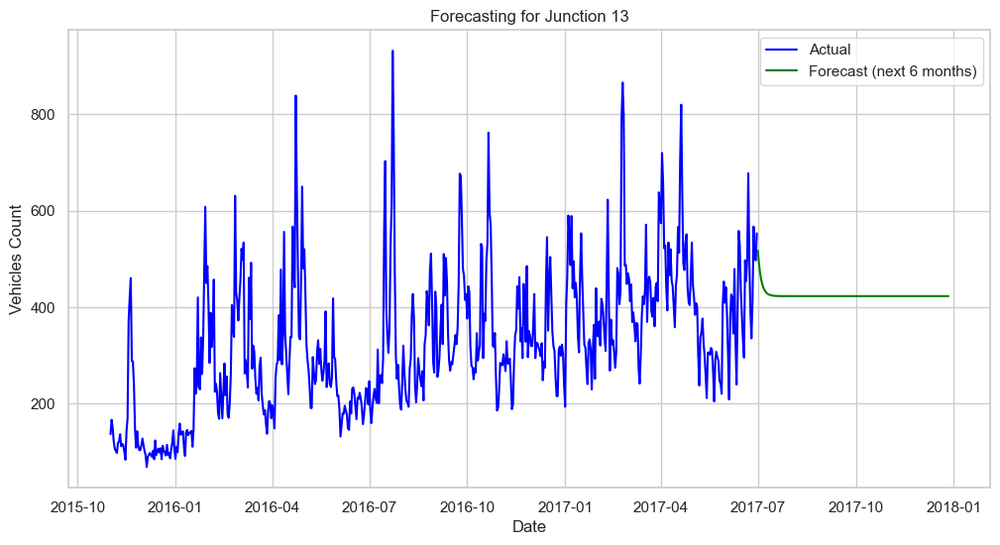


Processing Junction 14...
Using Seasonality Period (m): 7
Selected SARIMA Model: (p,d,q)=(6,1,0), (P,D,Q,s)=(2,0,1,7)
Junction 14: MAPE: 4.92%, Accuracy: 95.08%


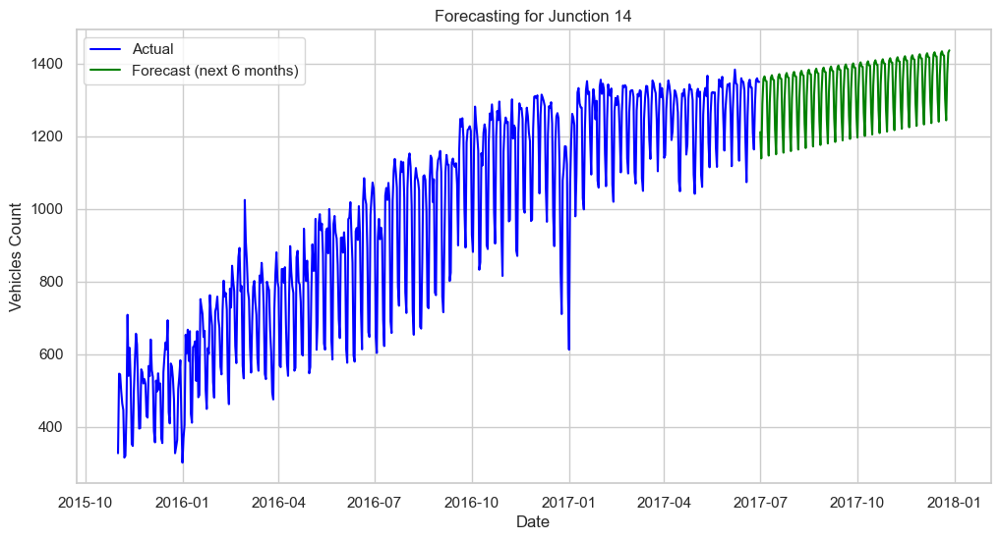


Total Execution Time: 2073.98 seconds


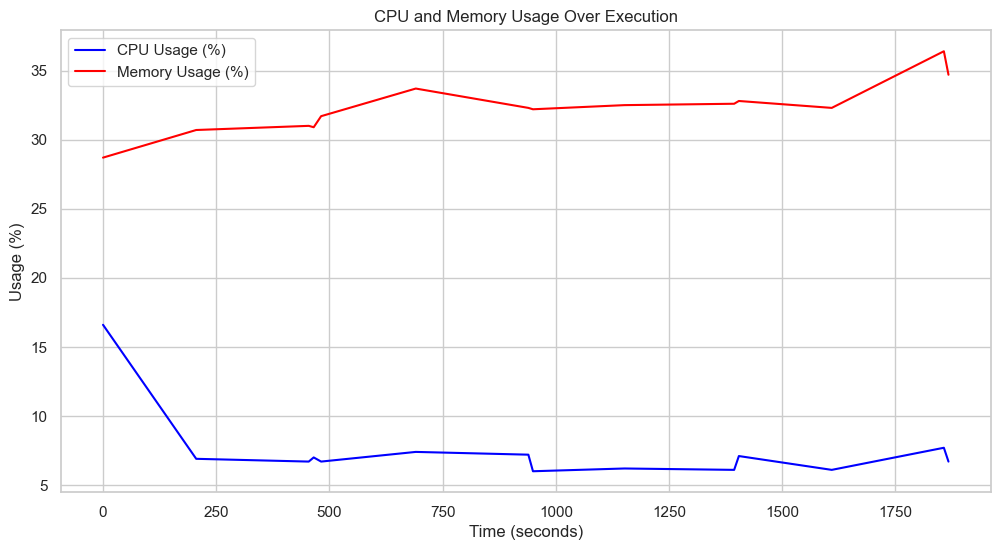

In [44]:
import time
import psutil
from pmdarima import auto_arima

# Ignore warnings for cleaner output
warnings.filterwarnings("ignore")

# Set style
sns.set_style("whitegrid")

# Define forecasting period
forecast_period = 180

# Track total execution time
start_time = time.time()

# Track CPU and memory usage
time_stamps = []
cpu_usages = []
memory_usages = []

# List of junctions with no seasonality
no_seasonality_junctions = {3, 7, 10, 13}

# Loop through each junction
for junction in junctions:
    print(f"\nProcessing Junction {junction}...")
    
    # Capture resource usage
    time_stamps.append(time.time() - start_time)
    cpu_usages.append(psutil.cpu_percent())
    memory_usages.append(psutil.virtual_memory().percent)
    
    # Filter data for the junction
    subset = final_data[final_data['Junction'] == junction].copy()
    subset = subset[['Vehicles']].dropna()  # Keep only the 'Vehicles' column

    # Ensure the index is datetime
    subset.index = pd.to_datetime(subset.index)

    # --- Set Seasonality Based on Junction ---
    m = None if junction in no_seasonality_junctions else 7
    print(f"Using Seasonality Period (m): {m if m else 'No Seasonality'}")


    # Split data into train and test sets (80/20 split)
    train_size = int(len(subset) * 0.8)
    train, test = subset.iloc[:train_size], subset.iloc[train_size:]


    # --- Model Selection ---
    try:
        model = auto_arima(
            train['Vehicles'], 
            seasonal=(m is not None),  # Enable seasonality only when m is set
            m=m if m else 1,  # If no seasonality, set m=1 to avoid errors
            trace=False,  
            suppress_warnings=True,
            stepwise=True,
            max_p=None, max_q=None, max_P=None, max_Q=None,  # No limits
            d=None, D=None  # Automatically determine differencing
        )

        # Extract model parameters
        p, d, q = model.order
        P, D, Q, s = model.seasonal_order if m else (0, 0, 0, 0)

        print(f"Selected SARIMA Model: (p,d,q)=({p},{d},{q}), (P,D,Q,s)=({P},{D},{Q},{s})")
    
    except Exception as e:
        print(f"Model failed: {e}, skipping junction.")
        continue

    

    # Compute evaluation metrics
    mape = np.mean(np.abs((list(test['Vehicles']) - predictions) / list(test['Vehicles']))) * 100
    acc = 100 - mape

    print(f"Junction {junction}: MAPE: {mape:.2f}%, Accuracy: {acc:.2f}%")

    # --- Forecasting ---
    forecast = model.predict(n_periods=forecast_period)
    forecast_dates = pd.date_range(start=subset.index[-1], periods=forecast_period+1, freq='D')[1:]

    # --- Plot Results ---
    plt.figure(figsize=(12, 6))
    plt.plot(subset.index, subset['Vehicles'], label="Actual", color="blue")
    plt.plot(forecast_dates, forecast, label="Forecast (next 6 months)", color="green")

    plt.title(f"Forecasting for Junction {junction}")
    plt.xlabel("Date")
    plt.ylabel("Vehicles Count")
    plt.legend()
    plt.show()

# Total execution time
end_time = time.time()
print(f"\nTotal Execution Time: {end_time - start_time:.2f} seconds")

# --- Plot CPU and Memory Usage ---
plt.figure(figsize=(12, 6))
plt.plot(time_stamps, cpu_usages, label='CPU Usage (%)', color='blue')
plt.plot(time_stamps, memory_usages, label='Memory Usage (%)', color='red')
plt.xlabel('Time (seconds)')
plt.ylabel('Usage (%)')
plt.title('CPU and Memory Usage Over Execution')
plt.legend()
plt.show()